# **PV Power Generation Forecasting Based on XGBoost and LSTM Models**
## *Cinthia Rodriguez, Jesús López, Sergio Cantillo and Yuri López*

###Contact:
> Cinthia Kathalina Rodríguez - cinthia.rodriguez@uao.edu.co






# Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import r2_score

from xgboost import XGBRegressor
import xgboost as xgb

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger


from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px

# Data Preprocessing

## Data Import

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

#change your path
data = pd.read_excel('/content/drive/My Drive/GitHub/PVPGF/DatasetGeneracion3.xlsx',  index_col=0)

data.index = pd.to_datetime(data.index, format='%d/%m/%Y %H:%M').strftime('%Y-%m-%d %H:%M:%S')
data.index = pd.to_datetime(data.index)
print(type(data.index))

data.head(23000)

Mounted at /content/drive
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>


,Generacion_(kWh)
Fecha,
2018-05-01 06:00:00,3.26
2018-05-01 07:00:00,16.66
2018-05-01 08:00:00,65.33
2018-05-01 09:00:00,148.75
2018-05-01 10:00:00,208.17
...,...
2023-02-28 14:00:00,145.39
2023-02-28 15:00:00,124.02
2023-02-28 16:00:00,49.21


In [ ]:
Datos = data.copy()
Datos.head()

,Generacion_(kWh)
Fecha,
2018-05-01 06:00:00,3.26
2018-05-01 07:00:00,16.66
2018-05-01 08:00:00,65.33
2018-05-01 09:00:00,148.75
2018-05-01 10:00:00,208.17


In [ ]:
Datos.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 22945 entries, 2018-05-01 06:00:00 to 2023-02-28 18:00:00
Data columns (total 1 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Generacion_(kWh)  22945 non-null  float64
dtypes: float64(1)
memory usage: 358.5 KB


In [ ]:
Datos.memory_usage().sum()

367120

In [ ]:
total = Datos.isnull().sum().sort_values(ascending=False)
percent_1 = Datos.isnull().sum()/Datos.isnull().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(Datos.size)

,Total,%
Generacion_(kWh),0,0.0


In [ ]:
Datos.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Generacion_(kWh),22945.0,194.671346,281.102765,0.0,27.68,114.93,202.88,1000.0


In [ ]:
Datos['Date'] = Datos.index
Datos['Year'] = Datos.index.year
Datos['Month'] = Datos.index.month
Datos['Day'] = Datos.index.day
Datos['Day number'] = Datos.index.day_of_week
Datos['Hour'] = Datos.index.hour

Datos.head(23000)

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2018-05-01 06:00:00,3.26,2018-05-01 06:00:00,2018,5,1,1,6
2018-05-01 07:00:00,16.66,2018-05-01 07:00:00,2018,5,1,1,7
2018-05-01 08:00:00,65.33,2018-05-01 08:00:00,2018,5,1,1,8
2018-05-01 09:00:00,148.75,2018-05-01 09:00:00,2018,5,1,1,9
2018-05-01 10:00:00,208.17,2018-05-01 10:00:00,2018,5,1,1,10
...,...,...,...,...,...,...,...
2023-02-28 14:00:00,145.39,2023-02-28 14:00:00,2023,2,28,1,14
2023-02-28 15:00:00,124.02,2023-02-28 15:00:00,2023,2,28,1,15
2023-02-28 16:00:00,49.21,2023-02-28 16:00:00,2023,2,28,1,16


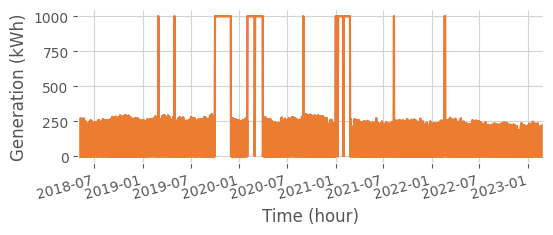

In [ ]:
plt.figure(figsize=(6, 2))
plt.plot(Datos['Generacion_(kWh)'])
plt.plot(Datos['Generacion_(kWh)'], color='#EC7C30')

plt.xlabel('Time (hour)')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')
fecha_minima = pd.Timestamp('2018-05-01 06:00:00')
fecha_maxima = pd.Timestamp('2023-02-28 18:00:00')
plt.xlim(fecha_minima, fecha_maxima)
plt.xticks(rotation=15, ha="right")

plt.grid(True, color='lightgray')
plt.show()


## Data Imputation



For data imputation, three different forms of imputation were tested for performance, so first a section of the time series without information gaps was selected.

In [ ]:
DatosP = Datos.copy()
DatosP.head()

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2018-05-01 06:00:00,3.26,2018-05-01 06:00:00,2018,5,1,1,6
2018-05-01 07:00:00,16.66,2018-05-01 07:00:00,2018,5,1,1,7
2018-05-01 08:00:00,65.33,2018-05-01 08:00:00,2018,5,1,1,8
2018-05-01 09:00:00,148.75,2018-05-01 09:00:00,2018,5,1,1,9
2018-05-01 10:00:00,208.17,2018-05-01 10:00:00,2018,5,1,1,10


In [ ]:
DatosPI = DatosP.loc['2022-02-21 06:00:00':'2023-02-28 18:00:00']
DatosPI.head(5000)

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2022-02-21 06:00:00,4.00,2022-02-21 06:00:00,2022,2,21,0,6
2022-02-21 07:00:00,35.04,2022-02-21 07:00:00,2022,2,21,0,7
2022-02-21 08:00:00,45.73,2022-02-21 08:00:00,2022,2,21,0,8
2022-02-21 09:00:00,32.26,2022-02-21 09:00:00,2022,2,21,0,9
2022-02-21 10:00:00,141.50,2022-02-21 10:00:00,2022,2,21,0,10
...,...,...,...,...,...,...,...
2023-02-28 14:00:00,145.39,2023-02-28 14:00:00,2023,2,28,1,14
2023-02-28 15:00:00,124.02,2023-02-28 15:00:00,2023,2,28,1,15
2023-02-28 16:00:00,49.21,2023-02-28 16:00:00,2023,2,28,1,16


In [ ]:
total = DatosPI.isna().sum().sort_values(ascending=False)
percent_1 = DatosPI.isna().sum()/DatosPI.isna().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(DatosPI.size)

,Total,%
Generacion_(kWh),0,0.0
Date,0,0.0
Year,0,0.0
Month,0,0.0
Day,0,0.0
Day number,0,0.0
Hour,0,0.0


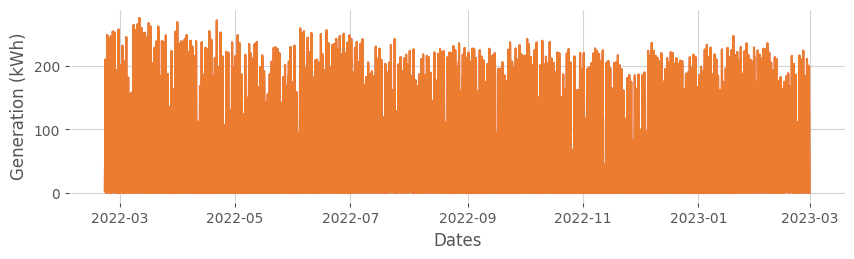

In [ ]:
plt.figure(figsize=(10, 2.5))
plt.plot(DatosPI['Generacion_(kWh)'])
plt.plot(DatosPI['Generacion_(kWh)'], color='#EC7C30')

plt.xlabel('Dates')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

Later, data was randomly selected.

In [ ]:
start_date = '2022-04-21 06:00:00'
random_data = DatosPI[DatosPI.index >= start_date].sample(n=485)  # Seleccionar 485 filas aleatorias

print(random_data)

                     Generacion_(kWh)                Date  Year  Month  Day  \
Fecha                                                                         
2022-08-02 15:00:00            131.76 2022-08-02 15:00:00  2022      8    2   
2022-08-05 10:00:00            159.48 2022-08-05 10:00:00  2022      8    5   
2022-05-22 06:00:00             10.18 2022-05-22 06:00:00  2022      5   22   
2022-07-19 17:00:00             16.70 2022-07-19 17:00:00  2022      7   19   
2022-06-08 07:00:00             46.22 2022-06-08 07:00:00  2022      6    8   
...                               ...                 ...   ...    ...  ...   
2022-10-24 14:00:00             91.89 2022-10-24 14:00:00  2022     10   24   
2022-11-02 14:00:00             81.44 2022-11-02 14:00:00  2022     11    2   
2022-08-06 10:00:00            174.56 2022-08-06 10:00:00  2022      8    6   
2022-06-16 09:00:00            130.63 2022-06-16 09:00:00  2022      6   16   
2023-01-13 10:00:00            183.41 2023-01-13 10:

Given the characteristics of the series, there are data with zero value. To identify the missing data and replace them during imputation, the value of the randomly selected data was changed to 600, a number outside the range of the data.

In [ ]:
DatosPI2 = DatosPI.copy()
DatosPI2.loc[random_data.index, 'Generacion_(kWh)'] = 600

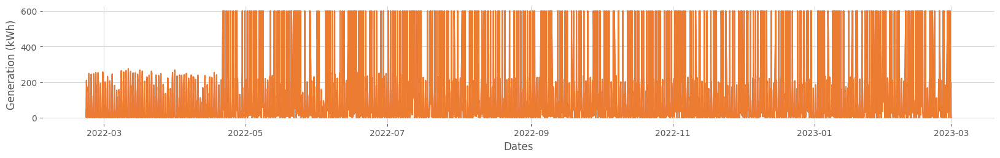

In [ ]:
plt.figure(figsize=(20, 2.5))
plt.plot(DatosPI2['Generacion_(kWh)'])
plt.plot(DatosPI2['Generacion_(kWh)'], color='#EC7C30')

plt.xlabel('Dates')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

### Average with moving window

In [ ]:
DatosPIP = DatosPI2.copy()

In [ ]:
cont= 0
for i in range(0, len(DatosPIP.index)):

  if DatosPIP.iloc[i, 0] == 600:

    old_data = DatosPIP[DatosPIP["Date"].apply(lambda x: x.hour == DatosPIP['Hour'].iloc[i] and x < DatosPIP["Date"].iloc[i])]
    Prom = (old_data['Generacion_(kWh)'][-60:-30].mean())*0.7 + (old_data['Generacion_(kWh)'][-30:].mean())*0.3

    if Prom >= 200:

      Prom = Prom + abs(np.random.normal(loc=104.3, scale=83.52, size=1))*0.05

    DatosPIP['Generacion_(kWh)'].iloc[i] = Prom

DatosPIP.head()

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2022-02-21 06:00:00,4.00,2022-02-21 06:00:00,2022,2,21,0,6
2022-02-21 07:00:00,35.04,2022-02-21 07:00:00,2022,2,21,0,7
2022-02-21 08:00:00,45.73,2022-02-21 08:00:00,2022,2,21,0,8
2022-02-21 09:00:00,32.26,2022-02-21 09:00:00,2022,2,21,0,9
2022-02-21 10:00:00,141.50,2022-02-21 10:00:00,2022,2,21,0,10


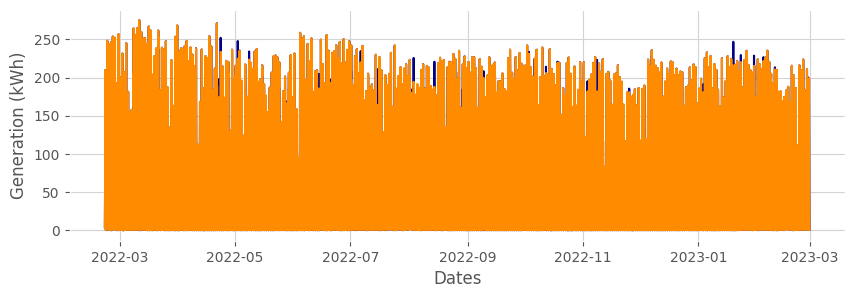

In [ ]:
# Plotting Generation
plt.figure(figsize=(10, 3))
plt.plot(DatosPI['Generacion_(kWh)'], color='darkblue')
plt.plot(DatosPIP['Generacion_(kWh)'], color='darkorange')

plt.xlabel('Dates')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

In [ ]:
total = DatosPIP.isna().sum().sort_values(ascending=False)
percent_1 = DatosPIP.isna().sum()/DatosPIP.isna().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(DatosPIP.size)

,Total,%
Generacion_(kWh),0,0.0
Date,0,0.0
Year,0,0.0
Month,0,0.0
Day,0,0.0
Day number,0,0.0
Hour,0,0.0


RMSE calculation

In [ ]:
MSE_I1 = mean_squared_error(DatosPI['Generacion_(kWh)'], DatosPIP['Generacion_(kWh)'])

RMSE_I1 = np.sqrt(MSE_I1)
p_RMSE_I1 = (RMSE_I1 / 250) * 100

print(RMSE_I1)
print(p_RMSE_I1)

9.888632223251324
3.95545288930053


### Mean

In [ ]:
DatosPIM = DatosPI2.copy()

In [ ]:
cont= 0
for i in range(0, len(DatosPIM.index)):

  if DatosPIM.iloc[i, 0] == 600:

    old_data2 = DatosPIM[DatosPIM["Date"].apply(lambda x: x.hour == DatosPIM['Hour'].iloc[i] and x < DatosPIM["Date"].iloc[i])]
    Prom = old_data2['Generacion_(kWh)'].mean()
    DatosPIM['Generacion_(kWh)'].iloc[i] = Prom

DatosPIM.head()

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2022-02-21 06:00:00,4.00,2022-02-21 06:00:00,2022,2,21,0,6
2022-02-21 07:00:00,35.04,2022-02-21 07:00:00,2022,2,21,0,7
2022-02-21 08:00:00,45.73,2022-02-21 08:00:00,2022,2,21,0,8
2022-02-21 09:00:00,32.26,2022-02-21 09:00:00,2022,2,21,0,9
2022-02-21 10:00:00,141.50,2022-02-21 10:00:00,2022,2,21,0,10


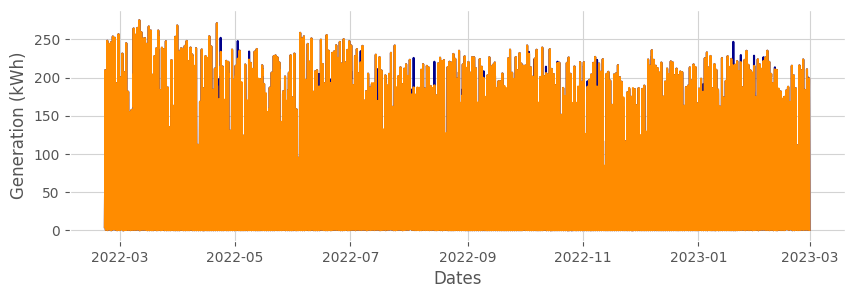

In [ ]:
# Plotting Generation
plt.figure(figsize=(10, 3))
plt.plot(DatosPI['Generacion_(kWh)'], color='darkblue')
plt.plot(DatosPIM['Generacion_(kWh)'], color='darkorange')

plt.xlabel('Dates')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

In [ ]:
total = DatosPIM.isna().sum().sort_values(ascending=False)
percent_1 = DatosPIM.isna().sum()/DatosPIM.isna().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(DatosPIM.size)

,Total,%
Generacion_(kWh),0,0.0
Date,0,0.0
Year,0,0.0
Month,0,0.0
Day,0,0.0
Day number,0,0.0
Hour,0,0.0


In [ ]:
MSE_I2 = mean_squared_error(DatosPI['Generacion_(kWh)'], DatosPIM['Generacion_(kWh)'])

RMSE_I2 = np.sqrt(MSE_I2)
p_RMSE_I2 = (RMSE_I2 / 250) * 100

print(RMSE_I2)
print(p_RMSE_I2)

9.88127916637859
3.9525116665514357


### Median

In [ ]:
DatosPIMd = DatosPI2.copy()

In [ ]:
cont= 0
for i in range(0, len(DatosPIMd.index)):

  if DatosPIMd.iloc[i, 0] == 600:

    old_data3 = DatosPIMd[DatosPIMd["Date"].apply(lambda x: x.hour == DatosPIMd['Hour'].iloc[i] and x < DatosPIMd["Date"].iloc[i])]
    Prom = old_data3['Generacion_(kWh)'].median()
    DatosPIMd['Generacion_(kWh)'].iloc[i] = Prom

DatosPIMd.head()

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2022-02-21 06:00:00,4.00,2022-02-21 06:00:00,2022,2,21,0,6
2022-02-21 07:00:00,35.04,2022-02-21 07:00:00,2022,2,21,0,7
2022-02-21 08:00:00,45.73,2022-02-21 08:00:00,2022,2,21,0,8
2022-02-21 09:00:00,32.26,2022-02-21 09:00:00,2022,2,21,0,9
2022-02-21 10:00:00,141.50,2022-02-21 10:00:00,2022,2,21,0,10


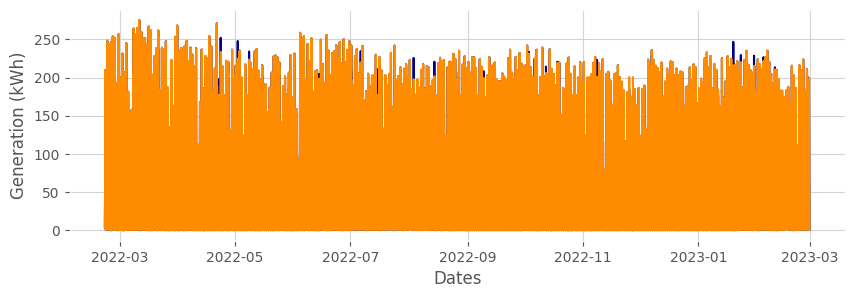

In [ ]:
# Plotting Generation
plt.figure(figsize=(10, 3))
plt.plot(DatosPI['Generacion_(kWh)'], color='darkblue')
plt.plot(DatosPIMd['Generacion_(kWh)'], color='darkorange')

plt.xlabel('Dates')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

In [ ]:
total = DatosPIMd.isna().sum().sort_values(ascending=False)
percent_1 = DatosPIMd.isna().sum()/DatosPIMd.isna().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(DatosPIMd.size)

,Total,%
Generacion_(kWh),0,0.0
Date,0,0.0
Year,0,0.0
Month,0,0.0
Day,0,0.0
Day number,0,0.0
Hour,0,0.0


In [ ]:
MSE_I3 = mean_squared_error(DatosPI['Generacion_(kWh)'], DatosPIMd['Generacion_(kWh)'])

RMSE_I3 = np.sqrt(MSE_I3)
p_RMSE_I3 = (RMSE_I3 / 250) * 100

print(RMSE_I3)
print(p_RMSE_I3)

10.278521133247745
4.111408453299098


Performance comparison

In [ ]:
method1 = [RMSE_I1, p_RMSE_I1]
method2 = [RMSE_I2, p_RMSE_I2]
method3 = [RMSE_I3, p_RMSE_I3]

results = {'Average MW': method1, 'Mean': method2, 'Median': method3}
results_table = pd.DataFrame(results, index=['MSE', 'P RMSE'])
print(results_table)

        Average MW      Mean     Median
MSE       9.888632  9.881279  10.278521
P RMSE    3.955453  3.952512   4.111408


### Selected method

The Average with Moving Window method was chosen because, unlike other models, it does not require the use of all previous data, yet it performs similarly or better than other methods.

In [ ]:
DatosI = Datos.copy()
DatosI.head()

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2018-05-01 06:00:00,3.26,2018-05-01 06:00:00,2018,5,1,1,6
2018-05-01 07:00:00,16.66,2018-05-01 07:00:00,2018,5,1,1,7
2018-05-01 08:00:00,65.33,2018-05-01 08:00:00,2018,5,1,1,8
2018-05-01 09:00:00,148.75,2018-05-01 09:00:00,2018,5,1,1,9
2018-05-01 10:00:00,208.17,2018-05-01 10:00:00,2018,5,1,1,10


In [ ]:
cont= 0
for i in range(0, len(DatosI.index)):
  cont = cont + 1
  print(cont)
  if DatosI.iloc[i, 0] == 1000:

    old_data = DatosI[DatosI["Date"].apply(lambda x: x.hour == DatosI['Hour'].iloc[i] and x < DatosI["Date"].iloc[i])]
    Prom = (old_data['Generacion_(kWh)'][-60:-30].mean())*0.7 + (old_data['Generacion_(kWh)'][-30:].mean())*0.3

    if Prom >= 200:

      Prom = Prom + abs(np.random.normal(loc=104.3, scale=83.52, size=1))*0.05

    DatosI['Generacion_(kWh)'].iloc[i] = Prom

DatosI.head()

Se han truncado las últimas 5000 líneas del flujo de salida.
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18032
18033
18034
18035
18036
18037
18038
18039
18040
18041
18042
18043
18044
18045
18046
18047
18048
18049
18050
18051
18052
18053
18054
18055
18056
18057
18058
18059
18060
18061
18062
18063
18064
18065
18066
18067
18068
18069
18070
18071
18072
18073
18074
18075
18076
18077
18078
18079
18080
18081
18082
18083
18084
18085
18086
18087
18088
18089
18090
18091
18092
18093
18094
18095
18096
18097
18098
18099
18100
18101
181

,Generacion_(kWh),Date,Year,Month,Day,Day number,Hour
Fecha,,,,,,,
2018-05-01 06:00:00,3.26,2018-05-01 06:00:00,2018,5,1,1,6
2018-05-01 07:00:00,16.66,2018-05-01 07:00:00,2018,5,1,1,7
2018-05-01 08:00:00,65.33,2018-05-01 08:00:00,2018,5,1,1,8
2018-05-01 09:00:00,148.75,2018-05-01 09:00:00,2018,5,1,1,9
2018-05-01 10:00:00,208.17,2018-05-01 10:00:00,2018,5,1,1,10


In [ ]:
total = DatosI.isna().sum().sort_values(ascending=False)
percent_1 = DatosI.isna().sum()/DatosI.isna().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head(DatosI.size)

,Total,%
Generacion_(kWh),0,0.0
Date,0,0.0
Year,0,0.0
Month,0,0.0
Day,0,0.0
Day number,0,0.0
Hour,0,0.0


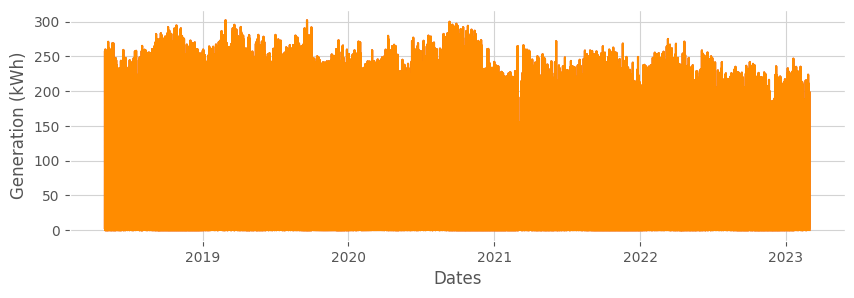

In [ ]:
# Plotting Generation
plt.figure(figsize=(10, 3))
plt.plot(DatosI['Generacion_(kWh)'])
plt.plot(DatosI['Generacion_(kWh)'], color='darkorange')

plt.xlabel('Dates')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

In [ ]:
print(min(DatosI['Generacion_(kWh)']))

0.0


In [ ]:
rd= abs(np.random.normal(loc=104.3, scale=83.52, size=1))*0.1
print(rd)

[5.59082329]


In [ ]:
del(DatosI['Date'])
DatosI.head()

,Generacion_(kWh),Year,Month,Day,Day number,Hour
Fecha,,,,,,
2018-05-01 06:00:00,3.26,2018,5,1,1,6
2018-05-01 07:00:00,16.66,2018,5,1,1,7
2018-05-01 08:00:00,65.33,2018,5,1,1,8
2018-05-01 09:00:00,148.75,2018,5,1,1,9
2018-05-01 10:00:00,208.17,2018,5,1,1,10


Download complete data

In [ ]:
DatosI.to_excel('CompleteData.xlsx', sheet_name='Data')

## Load complete data

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

DatosF = pd.read_excel('/content/drive/My Drive/GitHub/PVPGF/CompleteData.xlsx', index_col=0)
DatosF.head(23000)

Mounted at /content/drive


,Generacion_(kWh),Year,Month,Day,Day number,Hour
Fecha,,,,,,
2018-05-01 06:00:00,3.26,2018,5,1,1,6
2018-05-01 07:00:00,16.66,2018,5,1,1,7
2018-05-01 08:00:00,65.33,2018,5,1,1,8
2018-05-01 09:00:00,148.75,2018,5,1,1,9
2018-05-01 10:00:00,208.17,2018,5,1,1,10
...,...,...,...,...,...,...
2023-02-28 14:00:00,145.39,2023,2,28,1,14
2023-02-28 15:00:00,124.02,2023,2,28,1,15
2023-02-28 16:00:00,49.21,2023,2,28,1,16


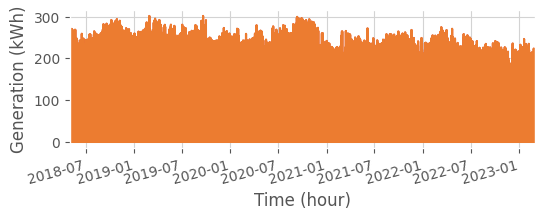

In [ ]:
# Plotting Generation
plt.figure(figsize=(6, 1.8))
plt.plot(DatosF['Generacion_(kWh)'])
plt.plot(DatosF['Generacion_(kWh)'], color='#EC7C30')

plt.xlabel('Time (hour)')
plt.ylabel('Generation (kWh)')
plt.gca().set_facecolor('white')

fecha_minima = pd.Timestamp('2018-05-01 06:00:00')
fecha_maxima = pd.Timestamp('2023-02-28 18:00:00')
plt.xlim(fecha_minima, fecha_maxima)
plt.xticks(rotation=15, ha="right")

plt.grid(True, color='lightgray')
plt.show()

## Average Annual Generation

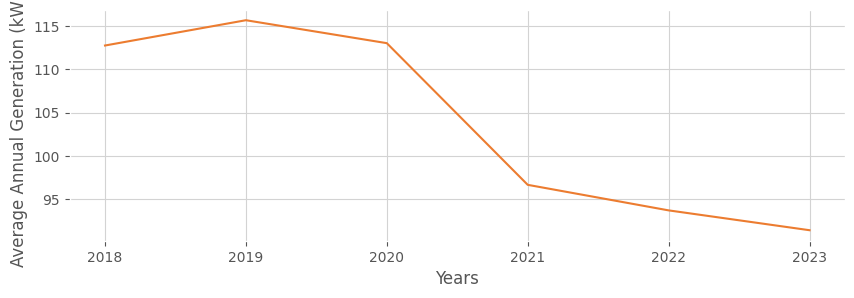

In [ ]:
DatosF_Anual = DatosF.groupby(pd.Grouper(freq='Y'))['Generacion_(kWh)'].mean()
DatosF_Anual.index = DatosF_Anual.index.year

plt.figure(figsize=(10, 3))
plt.plot(DatosF_Anual, color='#EC7C30')

plt.xlabel('Years')
plt.ylabel('Average Annual Generation (kWh)')
plt.style.use('ggplot')
plt.gca().set_facecolor('white')

plt.grid(True, color='lightgray')
plt.show()

## Generation Histogram

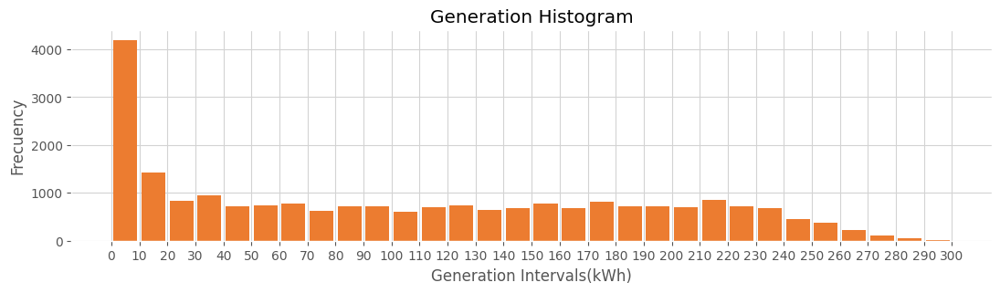

In [ ]:
intervals = [0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,
              190,200,210,220,230,240,250,260,270,280,290,300] #calculamos los extremos de los intervalos

plt.figure(figsize=(13, 3))
datos = pd.Series(DatosF['Generacion_(kWh)'])
plt.hist(x=DatosF['Generacion_(kWh)'], bins=intervals, color='#EC7C30', rwidth=0.85)
plt.xticks(intervals)
plt.ylabel('Frecuency')
plt.xlabel('Generation Intervals(kWh)')
plt.title('Generation Histogram')

plt.style.use('ggplot')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')

plt.show()

## Decomposing the time series
Trend, Seasonality and Residual

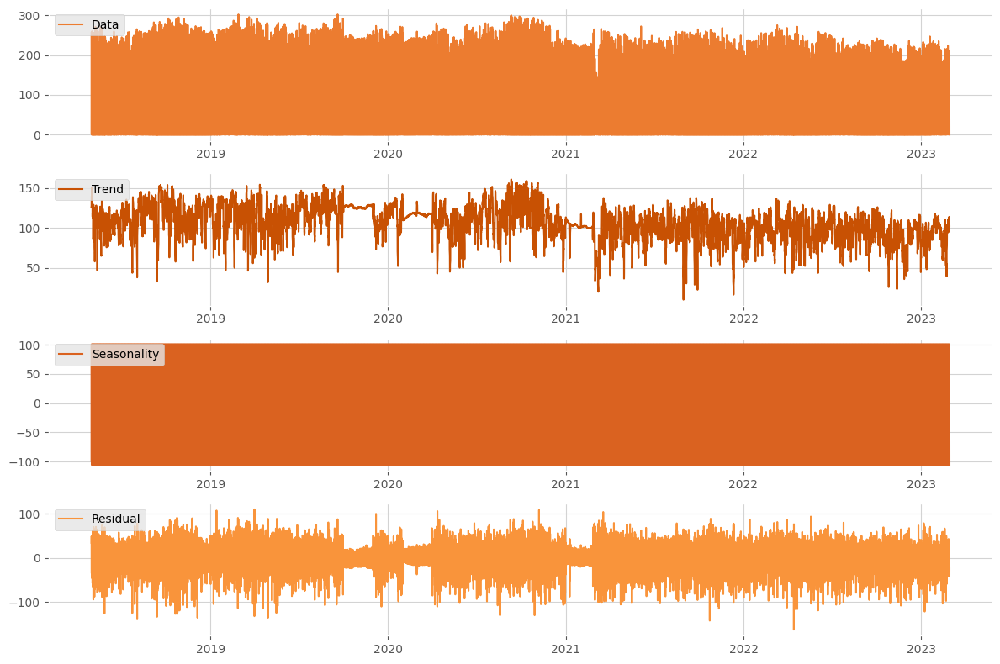

In [ ]:
generacion_decomposed = seasonal_decompose(DatosF['Generacion_(kWh)'],model='additive', period=13)

plt.figure(figsize=(12, 8))
plt.subplot(4, 1, 1)
plt.plot(DatosF['Generacion_(kWh)'], label='Data', color='#EC7C30')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.subplot(4, 1, 2)
plt.plot(generacion_decomposed.trend, label='Trend', color='#C85103')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.subplot(4, 1, 3)
plt.plot(generacion_decomposed.seasonal, label='Seasonality', color='#DA6220')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.subplot(4, 1, 4)
plt.plot(generacion_decomposed.resid, label='Residual', color='#F9943B')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.tight_layout()
plt.show()

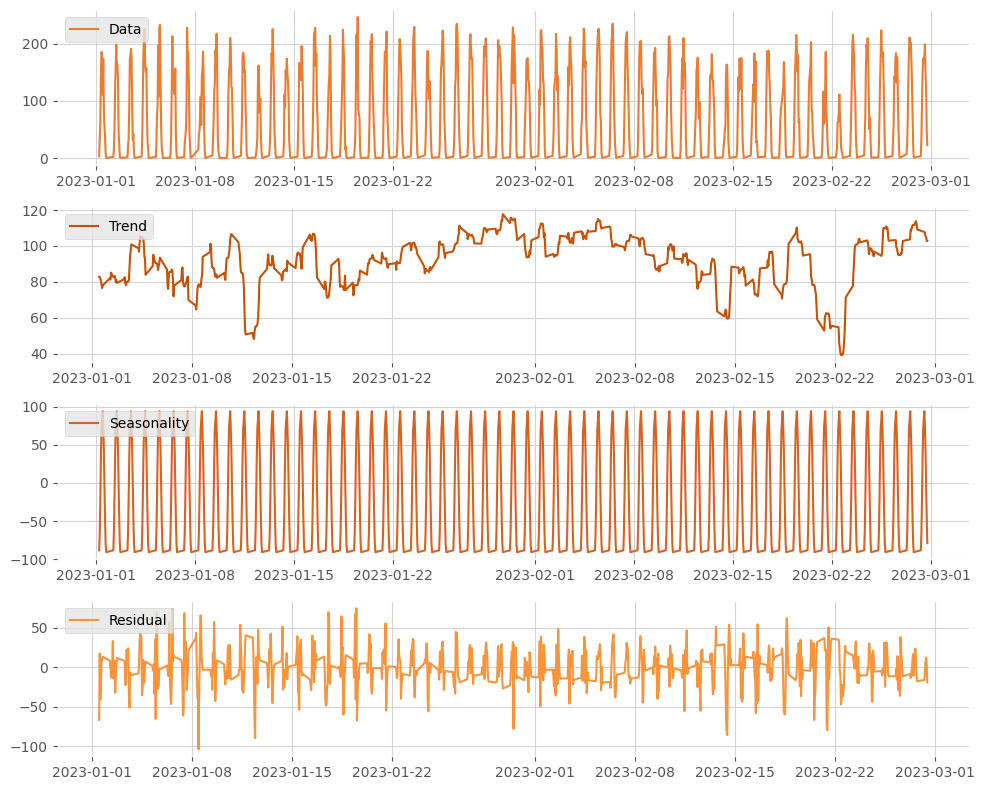

In [ ]:
generacion_decomposed = seasonal_decompose(DatosF['Generacion_(kWh)'][-767:-1],model='additive', period=13)


plt.figure(figsize=(10, 8))
plt.subplot(4, 1, 1)
plt.plot(DatosF['Generacion_(kWh)'][-767:-1], label='Data', color='#EC7C30')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.subplot(4, 1, 2)
plt.plot(generacion_decomposed.trend, label='Trend', color='#C85103')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.subplot(4, 1, 3)
plt.plot(generacion_decomposed.seasonal, label='Seasonality', color='#DA6220')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.subplot(4, 1, 4)
plt.plot(generacion_decomposed.resid, label='Residual', color='#F9943B')
plt.legend(loc='upper left')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.tight_layout()
plt.show()

## Testing Stationarity

The ADF statistic must be a large negative number and the p-value must be less than 0.05.

In [ ]:
ADF_result = adfuller(DatosF['Generacion_(kWh)'])
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -14.366048232546527
p-value: 9.668558543691363e-27


## Data seasonality

By month:

<Axes: xlabel='Month', ylabel='Generacion_(kWh)'>

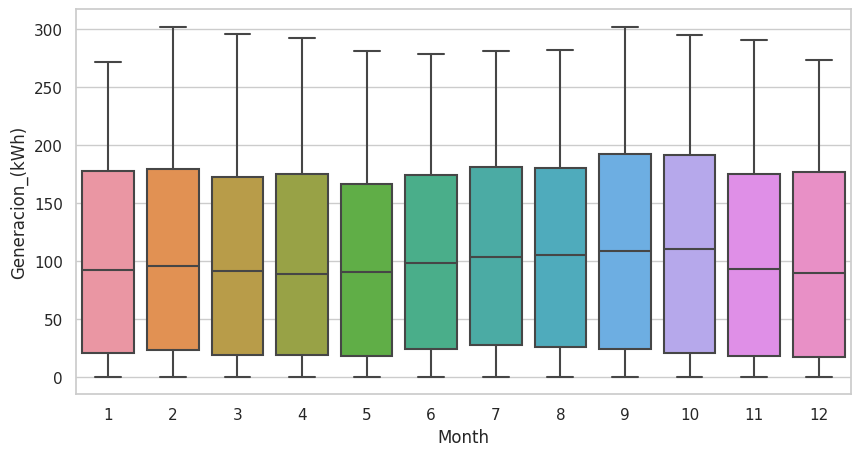

In [ ]:
sns.set(rc={'figure.figsize':(10, 5)})
sns.set_style("whitegrid")
sns.boxplot(data=DatosF,x='Month',y='Generacion_(kWh)')


Hourly:

<Axes: xlabel='Hour', ylabel='Generacion_(kWh)'>

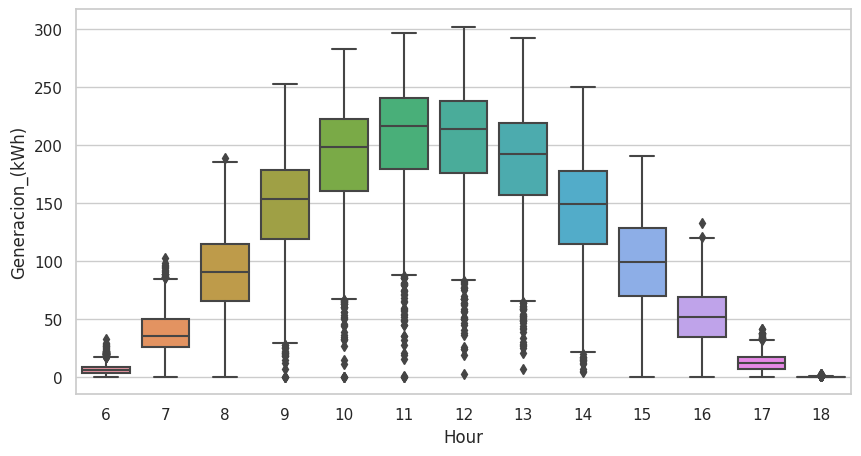

In [ ]:
sns.set(rc={'figure.figsize':(10, 5)})
sns.set_style("whitegrid")
sns.boxplot(data=DatosF,x='Hour',y='Generacion_(kWh)')


## Dataset division

In [ ]:
DatosM = pd.DataFrame({'Generacion_(kWh)': DatosF['Generacion_(kWh)']})
train = DatosM[:-4745]
test  = DatosM[-4745:] #20.68%

print(f"Fechas train : {train.index.min()} --- {train.index.max()}  (n={len(train)})")
print(f"Fechas test  : {test.index.min()} --- {test.index.max()}  (n={len(test)})")

Fechas train : 2018-05-01 06:00:00 --- 2022-02-28 18:00:00  (n=18200)
Fechas test  : 2022-03-01 06:00:00 --- 2023-02-28 18:00:00  (n=4745)


# Model Training

## Model 1: SARIMA

### Autocorrelation Function

The analysis reveals a moving average process and suggests that an autoregressive process is being studied.

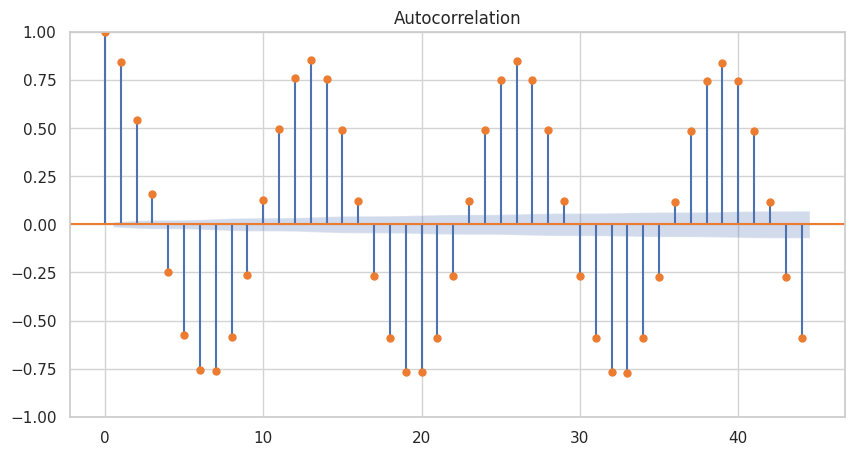

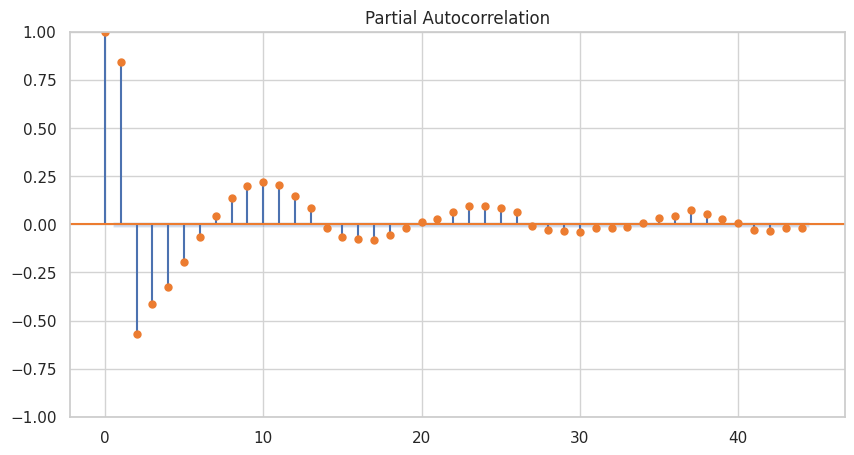

In [ ]:
plot_acf(DatosF['Generacion_(kWh)'], color='#EC7C30')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plot_pacf(DatosF['Generacion_(kWh)'], color='#EC7C30')
plt.gca().set_facecolor('white')
plt.grid(True, color='lightgray')
plt.show()

ADF test for non-differenced data

In [ ]:
ADF_result = adfuller(DatosF['Generacion_(kWh)'])
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -14.366048232546527
p-value: 9.668558543691363e-27


ADF test for data differentiated once

In [ ]:
generacion_diff = np.diff(DatosF['Generacion_(kWh)'], n=1)
ADF_result = adfuller(generacion_diff)
print(f'ADF Statistic: {ADF_result[0]}')
print(f'p-value: {ADF_result[1]}')

ADF Statistic: -34.7164194195516
p-value: 0.0


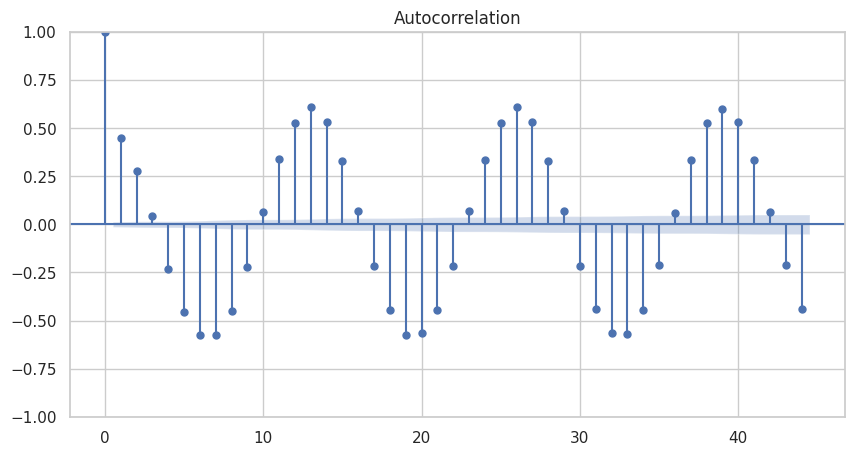

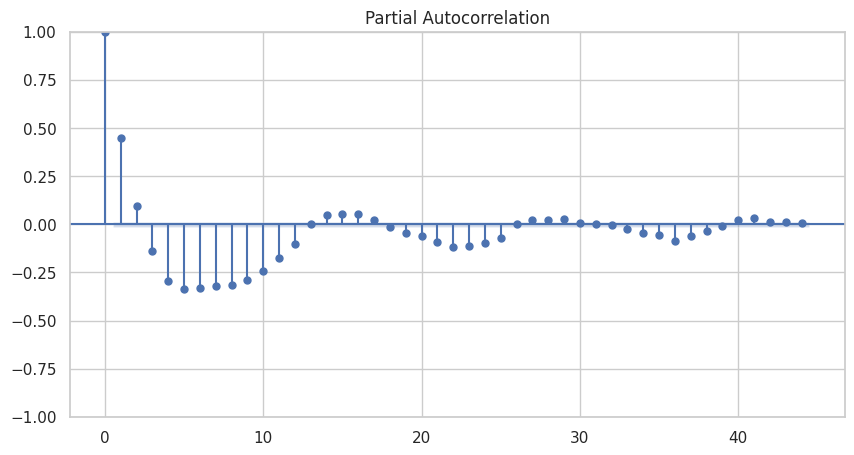

In [ ]:
plot_acf(generacion_diff)
plot_pacf(generacion_diff)
plt.show()

### Train

In [ ]:
trainSARIMA = train.copy()

In [ ]:
DatosM1 = pd.DataFrame({'Generacion_(kWh)': trainSARIMA['Generacion_(kWh)']})

In [ ]:
# Specify window size
window_size = 13*14

all_predictions = []
all_test_data = []

# Split the time series into windows
n_windows = int(len(DatosM1) / window_size)
for i in range(n_windows):

    train_data = DatosM1.iloc[i*window_size : (i+1)*window_size]
    print(train_data.shape)

    # Create a SARIMA model
    modelSARIMA = SARIMAX(train_data, order=(2, 1, 1), seasonal_order=(2, 1, 1, 13))

    # Fit the model to the training data
    resultsSARIMA = modelSARIMA.fit()

    # Perform forecast for validation data
    predictionsSARIMA = resultsSARIMA.predict(start=0, end=len(train_data)-1, dynamic=False)
    print(predictionsSARIMA.shape)

    # Store forecast and validation results in the corresponding lists
    all_predictions.extend(predictionsSARIMA)
    all_test_data.extend(train_data['Generacion_(kWh)'].tolist())

    # Display training data and forecasting data
    fig = go.Figure()
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(go.Scatter(x=train_data.index, y=train_data["Generacion_(kWh)"],
                    mode='lines', line=dict(width=2.5, color='#145DA0'), name="Training data", stackgaps='infer zero'), row=1, col=1)
    fig.add_trace(go.Scatter(x=train_data.index, y=predictionsSARIMA,
                    mode='lines', line=dict(width=2.5, color='#EC7C30'), name="Forecast", stackgaps='infer zero'), row=1, col=1)
    fig.update_layout(title='',
                      paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)',
                      width=1200,height=500,
                      yaxis=dict(color="black"),
                      xaxis=dict(color="black"),
                      font=dict(family="Fira Sans, Condensed", color='black'),
                      legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='black'),
                      showlegend=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
    fig.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
    fig.show()


    # Calculate errors for current window
    mse = mean_squared_error(train_data, predictionsSARIMA)
    mae = mean_absolute_error(train_data, predictionsSARIMA)
    p_mae = (mae / 250) * 100
    rmse = np.sqrt(mse)
    p_rmse = (rmse / 250) * 100
    r2 = r2_score(train_data, predictionsSARIMA)

    print("Root Mean Square Error:", rmse)
    print('P RMSE: %f' % p_rmse)
    print('------')
    print('MSE: %f' % mse)
    print('------')
    print('MAE: %f' % mae)
    print('P MAE: %f' % p_mae)
    print('------')
    print('R2 Score: %f' % r2)



(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


(182,)


Root Mean Square Error: 35.26738102523475
P RMSE: 14.106952
------
MSE: 1243.788164
------
MAE: 26.503324
P MAE: 10.601329
------
R2 Score: 0.847936
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 32.47660377638048
P RMSE: 12.990642
------
MSE: 1054.729793
------
MAE: 23.808499
P MAE: 9.523400
------
R2 Score: 0.852976
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 28.87488575347397
P RMSE: 11.549954
------
MSE: 833.759027
------
MAE: 20.583029
P MAE: 8.233212
------
R2 Score: 0.863032
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 25.552700008737233
P RMSE: 10.221080
------
MSE: 652.940478
------
MAE: 18.765389
P MAE: 7.506156
------
R2 Score: 0.892472
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 28.43262925888295
P RMSE: 11.373052
------
MSE: 808.414407
------
MAE: 21.381122
P MAE: 8.552449
------
R2 Score: 0.856290
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 25.68369586317462
P RMSE: 10.273478
------
MSE: 659.652233
------
MAE: 19.377946
P MAE: 7.751179
------
R2 Score: 0.900601
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 36.36710298017709
P RMSE: 14.546841
------
MSE: 1322.566179
------
MAE: 27.403783
P MAE: 10.961513
------
R2 Score: 0.810781
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 27.593389149797293
P RMSE: 11.037356
------
MSE: 761.395125
------
MAE: 19.824061
P MAE: 7.929624
------
R2 Score: 0.894715
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 25.789234751253538
P RMSE: 10.315694
------
MSE: 665.084629
------
MAE: 18.568583
P MAE: 7.427433
------
R2 Score: 0.910513
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 36.455873198767065
P RMSE: 14.582349
------
MSE: 1329.030691
------
MAE: 27.379486
P MAE: 10.951794
------
R2 Score: 0.838952
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 29.460829178296326
P RMSE: 11.784332
------
MSE: 867.940456
------
MAE: 21.565639
P MAE: 8.626256
------
R2 Score: 0.903851
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 35.08066043270949
P RMSE: 14.032264
------
MSE: 1230.652736
------
MAE: 25.725930
P MAE: 10.290372
------
R2 Score: 0.864353
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 45.78090341580003
P RMSE: 18.312361
------
MSE: 2095.891118
------
MAE: 33.009664
P MAE: 13.203866
------
R2 Score: 0.745073
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 37.405895625812754
P RMSE: 14.962358
------
MSE: 1399.201028
------
MAE: 26.905932
P MAE: 10.762373
------
R2 Score: 0.821442
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 37.63719857580413
P RMSE: 15.054879
------
MSE: 1416.558717
------
MAE: 27.682037
P MAE: 11.072815
------
R2 Score: 0.810716
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 35.286257420099076
P RMSE: 14.114503
------
MSE: 1245.119963
------
MAE: 25.081258
P MAE: 10.032503
------
R2 Score: 0.853607
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 27.72335297679089
P RMSE: 11.089341
------
MSE: 768.584300
------
MAE: 19.570366
P MAE: 7.828147
------
R2 Score: 0.898966
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 23.140852248124105
P RMSE: 9.256341
------
MSE: 535.499043
------
MAE: 14.391532
P MAE: 5.756613
------
R2 Score: 0.937219
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 35.953665820853466
P RMSE: 14.381466
------
MSE: 1292.666086
------
MAE: 26.918052
P MAE: 10.767221
------
R2 Score: 0.808334
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 31.59385983731147
P RMSE: 12.637544
------
MSE: 998.171979
------
MAE: 22.333142
P MAE: 8.933257
------
R2 Score: 0.877216
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 28.900073459918204
P RMSE: 11.560029
------
MSE: 835.214246
------
MAE: 21.332493
P MAE: 8.532997
------
R2 Score: 0.903053
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 32.014660929977474
P RMSE: 12.805864
------
MSE: 1024.938514
------
MAE: 24.353082
P MAE: 9.741233
------
R2 Score: 0.887848
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 32.10686634791515
P RMSE: 12.842747
------
MSE: 1030.850867
------
MAE: 23.764324
P MAE: 9.505730
------
R2 Score: 0.872763
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 38.62812465927609
P RMSE: 15.451250
------
MSE: 1492.132015
------
MAE: 29.163021
P MAE: 11.665208
------
R2 Score: 0.822231
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 39.72172921325974
P RMSE: 15.888692
------
MSE: 1577.815772
------
MAE: 29.831578
P MAE: 11.932631
------
R2 Score: 0.820779
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 36.49670885600118
P RMSE: 14.598684
------
MSE: 1332.009757
------
MAE: 27.329719
P MAE: 10.931887
------
R2 Score: 0.834177
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 28.855774111481857
P RMSE: 11.542310
------
MSE: 832.655700
------
MAE: 22.019764
P MAE: 8.807905
------
R2 Score: 0.863437
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 37.49029884908647
P RMSE: 14.996120
------
MSE: 1405.522508
------
MAE: 26.932663
P MAE: 10.773065
------
R2 Score: 0.835005
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 35.98786226697688
P RMSE: 14.395145
------
MSE: 1295.126231
------
MAE: 25.457520
P MAE: 10.183008
------
R2 Score: 0.817088
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 30.7352721121176
P RMSE: 12.294109
------
MSE: 944.656952
------
MAE: 21.219747
P MAE: 8.487899
------
R2 Score: 0.843985
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 29.176655389544415
P RMSE: 11.670662
------
MSE: 851.277220
------
MAE: 21.718080
P MAE: 8.687232
------
R2 Score: 0.896615
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 29.1203953332503
P RMSE: 11.648158
------
MSE: 847.997424
------
MAE: 20.956229
P MAE: 8.382492
------
R2 Score: 0.887599
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 29.18739765997214
P RMSE: 11.674959
------
MSE: 851.904182
------
MAE: 22.412081
P MAE: 8.964832
------
R2 Score: 0.866523
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 31.54472047639484
P RMSE: 12.617888
------
MSE: 995.069390
------
MAE: 22.246255
P MAE: 8.898502
------
R2 Score: 0.872811
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 29.84451010466146
P RMSE: 11.937804
------
MSE: 890.694783
------
MAE: 20.513890
P MAE: 8.205556
------
R2 Score: 0.894157
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 25.20432803607808
P RMSE: 10.081731
------
MSE: 635.258152
------
MAE: 17.559350
P MAE: 7.023740
------
R2 Score: 0.925395
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 36.455106068287485
P RMSE: 14.582042
------
MSE: 1328.974758
------
MAE: 27.348609
P MAE: 10.939443
------
R2 Score: 0.833601
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.408033272612093
P RMSE: 4.563213
------
MSE: 130.143223
------
MAE: 4.021551
P MAE: 1.608620
------
R2 Score: 0.982683
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.799034264771423
P RMSE: 4.719614
------
MSE: 139.217210
------
MAE: 4.335328
P MAE: 1.734131
------
R2 Score: 0.981451
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.516238781869626
P RMSE: 4.606496
------
MSE: 132.623756
------
MAE: 4.067874
P MAE: 1.627149
------
R2 Score: 0.982288
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.894914761619512
P RMSE: 4.757966
------
MSE: 141.488997
------
MAE: 4.303339
P MAE: 1.721336
------
R2 Score: 0.981592
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 24.064455479275694
P RMSE: 9.625782
------
MSE: 579.098018
------
MAE: 15.708090
P MAE: 6.283236
------
R2 Score: 0.928164
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 34.432973546978026
P RMSE: 13.773189
------
MSE: 1185.629667
------
MAE: 24.244215
P MAE: 9.697686
------
R2 Score: 0.824981
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 26.163561781077973
P RMSE: 10.465425
------
MSE: 684.531965
------
MAE: 18.566824
P MAE: 7.426729
------
R2 Score: 0.912404
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 21.263457206422007
P RMSE: 8.505383
------
MSE: 452.134612
------
MAE: 13.552849
P MAE: 5.421140
------
R2 Score: 0.946007
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 28.34418493330632
P RMSE: 11.337674
------
MSE: 803.392820
------
MAE: 19.778110
P MAE: 7.911244
------
R2 Score: 0.895726
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.03218593738677
P RMSE: 4.412874
------
MSE: 121.709127
------
MAE: 3.893720
P MAE: 1.557488
------
R2 Score: 0.983209
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 12.71118473558949
P RMSE: 5.084474
------
MSE: 161.574217
------
MAE: 5.277220
P MAE: 2.110888
------
R2 Score: 0.978975
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.473430791959405
P RMSE: 4.589372
------
MSE: 131.639614
------
MAE: 4.025817
P MAE: 1.610327
------
R2 Score: 0.982661
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 11.583493729070149
P RMSE: 4.633397
------
MSE: 134.177327
------
MAE: 4.029261
P MAE: 1.611704
------
R2 Score: 0.982579
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 38.22046223825119
P RMSE: 15.288185
------
MSE: 1460.803734
------
MAE: 25.880143
P MAE: 10.352057
------
R2 Score: 0.810108
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 33.11419781801105
P RMSE: 13.245679
------
MSE: 1096.550097
------
MAE: 23.946838
P MAE: 9.578735
------
R2 Score: 0.861868
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 34.9057985441186
P RMSE: 13.962319
------
MSE: 1218.414772
------
MAE: 24.227029
P MAE: 9.690812
------
R2 Score: 0.794312
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 26.7374228608515
P RMSE: 10.694969
------
MSE: 714.889781
------
MAE: 19.689398
P MAE: 7.875759
------
R2 Score: 0.876976
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 30.915874766123817
P RMSE: 12.366350
------
MSE: 955.791313
------
MAE: 23.507562
P MAE: 9.403025
------
R2 Score: 0.828389
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 28.6698240351496
P RMSE: 11.467930
------
MSE: 821.958810
------
MAE: 21.480365
P MAE: 8.592146
------
R2 Score: 0.893298
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 34.777271848738
P RMSE: 13.910909
------
MSE: 1209.458637
------
MAE: 25.070188
P MAE: 10.028075
------
R2 Score: 0.814122
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 31.36620839263095
P RMSE: 12.546483
------
MSE: 983.839029
------
MAE: 22.879539
P MAE: 9.151816
------
R2 Score: 0.876849
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 33.75587166265229
P RMSE: 13.502349
------
MSE: 1139.458872
------
MAE: 24.814405
P MAE: 9.925762
------
R2 Score: 0.866552
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 29.611203203678784
P RMSE: 11.844481
------
MSE: 876.823355
------
MAE: 22.430596
P MAE: 8.972238
------
R2 Score: 0.863110
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 43.024583840165754
P RMSE: 17.209834
------
MSE: 1851.114815
------
MAE: 28.801935
P MAE: 11.520774
------
R2 Score: 0.739266
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 38.93616705090749
P RMSE: 15.574467
------
MSE: 1516.025105
------
MAE: 27.380638
P MAE: 10.952255
------
R2 Score: 0.840544
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 36.70939883952859
P RMSE: 14.683760
------
MSE: 1347.579963
------
MAE: 27.290773
P MAE: 10.916309
------
R2 Score: 0.855220
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 30.511920301281464
P RMSE: 12.204768
------
MSE: 930.977280
------
MAE: 23.194243
P MAE: 9.277697
------
R2 Score: 0.902486
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 35.036988715372075
P RMSE: 14.014795
------
MSE: 1227.590578
------
MAE: 26.302159
P MAE: 10.520863
------
R2 Score: 0.863090
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 36.729535134131865
P RMSE: 14.691814
------
MSE: 1349.058751
------
MAE: 26.696036
P MAE: 10.678414
------
R2 Score: 0.851995
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 39.61854790697744
P RMSE: 15.847419
------
MSE: 1569.629338
------
MAE: 29.144323
P MAE: 11.657729
------
R2 Score: 0.799300
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 29.573764153493684
P RMSE: 11.829506
------
MSE: 874.607526
------
MAE: 21.341531
P MAE: 8.536612
------
R2 Score: 0.873628
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 23.622772789040763
P RMSE: 9.449109
------
MSE: 558.035394
------
MAE: 17.278156
P MAE: 6.911262
------
R2 Score: 0.925366
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 33.422121078507665
P RMSE: 13.368848
------
MSE: 1117.038177
------
MAE: 22.237195
P MAE: 8.894878
------
R2 Score: 0.827695
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 16.03314955943366
P RMSE: 6.413260
------
MSE: 257.061885
------
MAE: 8.761880
P MAE: 3.504752
------
R2 Score: 0.957635
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 11.232315843961421
P RMSE: 4.492926
------
MSE: 126.164919
------
MAE: 4.760935
P MAE: 1.904374
------
R2 Score: 0.979986
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 10.3972323488881
P RMSE: 4.158893
------
MSE: 108.102441
------
MAE: 3.394039
P MAE: 1.357616
------
R2 Score: 0.982591
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 23.968763396980634
P RMSE: 9.587505
------
MSE: 574.501619
------
MAE: 12.087219
P MAE: 4.834888
------
R2 Score: 0.909791
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 29.872236248674643
P RMSE: 11.948894
------
MSE: 892.350498
------
MAE: 21.277712
P MAE: 8.511085
------
R2 Score: 0.764369
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 33.28170271111099
P RMSE: 13.312681
------
MSE: 1107.671735
------
MAE: 24.208521
P MAE: 9.683409
------
R2 Score: 0.854389
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 34.526176126896026
P RMSE: 13.810470
------
MSE: 1192.056838
------
MAE: 25.326689
P MAE: 10.130676
------
R2 Score: 0.808031
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 31.865419700796647
P RMSE: 12.746168
------
MSE: 1015.404973
------
MAE: 24.939649
P MAE: 9.975860
------
R2 Score: 0.838352
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 36.57901578553993
P RMSE: 14.631606
------
MSE: 1338.024396
------
MAE: 24.811856
P MAE: 9.924742
------
R2 Score: 0.768284
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 33.012399249680655
P RMSE: 13.204960
------
MSE: 1089.818504
------
MAE: 24.664389
P MAE: 9.865756
------
R2 Score: 0.810019
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 29.882324671741838
P RMSE: 11.952930
------
MSE: 892.953328
------
MAE: 21.673883
P MAE: 8.669553
------
R2 Score: 0.836336
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 30.543942095723786
P RMSE: 12.217577
------
MSE: 932.932399
------
MAE: 22.289788
P MAE: 8.915915
------
R2 Score: 0.831025
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 29.58279074518207
P RMSE: 11.833116
------
MSE: 875.141508
------
MAE: 20.919377
P MAE: 8.367751
------
R2 Score: 0.852245
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 28.529045352348483
P RMSE: 11.411618
------
MSE: 813.906429
------
MAE: 22.146192
P MAE: 8.858477
------
R2 Score: 0.859370
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 28.47738932405834
P RMSE: 11.390956
------
MSE: 810.961703
------
MAE: 22.162363
P MAE: 8.864945
------
R2 Score: 0.855557
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 29.84178498081952
P RMSE: 11.936714
------
MSE: 890.532131
------
MAE: 22.411992
P MAE: 8.964797
------
R2 Score: 0.832237
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 36.838380617764734
P RMSE: 14.735352
------
MSE: 1357.066287
------
MAE: 26.502337
P MAE: 10.600935
------
R2 Score: 0.771725
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 34.59996446611551
P RMSE: 13.839986
------
MSE: 1197.157541
------
MAE: 25.510610
P MAE: 10.204244
------
R2 Score: 0.821893
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 31.221935551069524
P RMSE: 12.488774
------
MSE: 974.809260
------
MAE: 22.524899
P MAE: 9.009960
------
R2 Score: 0.868369
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 33.69216708761071
P RMSE: 13.476867
------
MSE: 1135.162123
------
MAE: 24.130385
P MAE: 9.652154
------
R2 Score: 0.842044
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 35.26892374637868
P RMSE: 14.107569
------
MSE: 1243.896982
------
MAE: 25.799543
P MAE: 10.319817
------
R2 Score: 0.818422
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 30.321839801366643
P RMSE: 12.128736
------
MSE: 919.413969
------
MAE: 23.567188
P MAE: 9.426875
------
R2 Score: 0.853295
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 41.93729217055294
P RMSE: 16.774917
------
MSE: 1758.736475
------
MAE: 29.740566
P MAE: 11.896226
------
R2 Score: 0.701323
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 32.25057440983562
P RMSE: 12.900230
------
MSE: 1040.099550
------
MAE: 22.975268
P MAE: 9.190107
------
R2 Score: 0.826748
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 30.812293506436635
P RMSE: 12.324917
------
MSE: 949.397431
------
MAE: 23.383315
P MAE: 9.353326
------
R2 Score: 0.813391
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 33.17544960329006
P RMSE: 13.270180
------
MSE: 1100.610456
------
MAE: 23.949881
P MAE: 9.579953
------
R2 Score: 0.795605
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



(182,)


Root Mean Square Error: 31.202735447245157
P RMSE: 12.481094
------
MSE: 973.610699
------
MAE: 22.744912
P MAE: 9.097965
------
R2 Score: 0.827047
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(182,)


Root Mean Square Error: 27.210248407542807
P RMSE: 10.884099
------
MSE: 740.397618
------
MAE: 19.469995
P MAE: 7.787998
------
R2 Score: 0.874596
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 29.493951727555203
P RMSE: 11.797581
------
MSE: 869.893189
------
MAE: 20.424083
P MAE: 8.169633
------
R2 Score: 0.865142
(182, 1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



(182,)


Root Mean Square Error: 29.94350386657584
P RMSE: 11.977402
------
MSE: 896.613424
------
MAE: 22.219867
P MAE: 8.887947
------
R2 Score: 0.864096


In [ ]:
all_predictions = np.clip(all_predictions, a_min=0, a_max=None)

# Calculate errors for all validation data
mse1 = mean_squared_error(all_test_data, all_predictions)
mae1 = mean_absolute_error(all_test_data, all_predictions)
p_mae1 = (mae1 / 250) * 100
rmse1 = np.sqrt(mse1)
p_rmse1 = (rmse1 / 250) * 100
r21 = r2_score(all_test_data, all_predictions)

print("Root Mean Square Error:", rmse1)
print('P RMSE: %f' % p_rmse1)
print('------')
print('MSE: %f' % mse1)
print('------')
print('MAE: %f' % mae1)
print('P MAE: %f' % p_mae1)
print('------')
print('R2 Score: %f' % r21)

Root Mean Square Error: 30.56767404960753
P RMSE: 12.227070
------
MSE: 934.382697
------
MAE: 20.692051
P MAE: 8.276820
------
R2 Score: 0.872474


In [ ]:
# Plotting the results
datos1=np.array(range(0, 18200))

fig2 = go.Figure()
fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=datos1, y=all_test_data,
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig2.add_trace(go.Scatter(x=datos1, y=all_predictions,
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig2.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=600,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=23, font_color='black'),
                  showlegend=True)
fig2.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig2.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig2.show()

## Model 2: LSTM

### Train

In [ ]:
trainLSTM = train.copy()
tf.random.set_seed(42)

In [ ]:
DatosM2 = pd.DataFrame({'Generacion_(kWh)': trainLSTM['Generacion_(kWh)']})

In [ ]:
#Normalize data
scaler = MinMaxScaler(feature_range=(-1,1))
DatosM2n = scaler.fit_transform(DatosM2)

seq_length = 13*14
out_length = 13

In [ ]:
#Series conversion in X and Y sequence

def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
   n_vars = 1 if type(data) is list else data.shape[1]
   df = pd.DataFrame(data)
   cols, names = list(), list()
   # input sequence (t-n, ... t-1)
   for i in range(n_in, 0, -1):
    cols.append(df.shift(i))
    names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
   # forecast sequence (t, t+1, ... t+n)
   for i in range(0, n_out):
    cols.append(df.shift(-i))
    if i == 0:
      names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
      names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
      agg.dropna(inplace=True)
   return agg

In [ ]:
data_train_LSTM = series_to_supervised(DatosM2n, seq_length, out_length)
print(data_train_LSTM.shape)

(18006, 195)


In [ ]:
X_train_LSTM = data_train_LSTM.values[:, 0:seq_length]
y_train_LSTM = data_train_LSTM.values[:, seq_length:]
print(X_train_LSTM.shape, y_train_LSTM.shape)
X_train_LSTM= X_train_LSTM.reshape(X_train_LSTM.shape[0], X_train_LSTM.shape[1], 1)
print(X_train_LSTM.shape, y_train_LSTM.shape)


(18006, 182) (18006, 13)
(18006, 182, 1) (18006, 13)


In [ ]:
# LSTM model creation
modelLSTM = Sequential()
modelLSTM.add(LSTM(64, activation= 'tanh', input_shape=(seq_length, 1), return_sequences = True))
#modelLSTM.add(Dropout(0.2))
modelLSTM.add(LSTM(45, activation= 'tanh', return_sequences = True))
#modelLSTM.add(Dropout(0.2))
modelLSTM.add(LSTM(32, activation= 'tanh'))
modelLSTM.add(Dense(13))
modelLSTM.compile(optimizer='adam', loss='mse')


In [ ]:
modelLSTM.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 182, 64)           16896     
                                                                 
 lstm_1 (LSTM)               (None, 182, 45)           19800     
                                                                 
 lstm_2 (LSTM)               (None, 32)                9984      
                                                                 
 dense (Dense)               (None, 13)                429       
                                                                 
Total params: 47109 (184.02 KB)
Trainable params: 47109 (184.02 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
callbacksLSTM = [EarlyStopping(patience=10, monitor='val_loss', mode='auto', restore_best_weights=True),\
                 ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose = 1, factor = 0.8, min_lr = 1e-5),\
                 CSVLogger('Train_Data.csv', separator=',', append=True),\
                 ModelCheckpoint('best_modelLSTM.h5', monitor='loss', save_best_only=True, verbose=1)]

# Model training
modelLSTM.fit(X_train_LSTM, y_train_LSTM, epochs=30, verbose=1, callbacks=[callbacksLSTM], validation_split=0.2)

Epoch 1/30
450/451 [============================>.] - ETA: 0s - loss: 0.0962
Epoch 1: loss improved from inf to 0.09617, saving model to best_modelLSTM.h5
451/451 [==============================] - 17s 23ms/step - loss: 0.0962 - val_loss: 0.0628 - lr: 0.0010
Epoch 2/30
  7/451 [..............................] - ETA: 7s - loss: 0.0585

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



449/451 [============================>.] - ETA: 0s - loss: 0.0548
Epoch 2: loss improved from 0.09617 to 0.05481, saving model to best_modelLSTM.h5
451/451 [==============================] - 10s 22ms/step - loss: 0.0548 - val_loss: 0.0586 - lr: 0.0010
Epoch 3/30
451/451 [==============================] - ETA: 0s - loss: 0.0529
Epoch 3: loss improved from 0.05481 to 0.05293, saving model to best_modelLSTM.h5
451/451 [==============================] - 10s 22ms/step - loss: 0.0529 - val_loss: 0.0546 - lr: 0.0010
Epoch 4/30
448/451 [============================>.] - ETA: 0s - loss: 0.0527
Epoch 4: loss improved from 0.05293 to 0.05262, saving model to best_modelLSTM.h5
451/451 [==============================] - 9s 20ms/step - loss: 0.0526 - val_loss: 0.0594 - lr: 0.0010
Epoch 5/30
449/451 [============================>.] - ETA: 0s - loss: 0.0516
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.000800000037997961.

Epoch 5: loss improved from 0.05262 to 0.05161, saving model to best_m

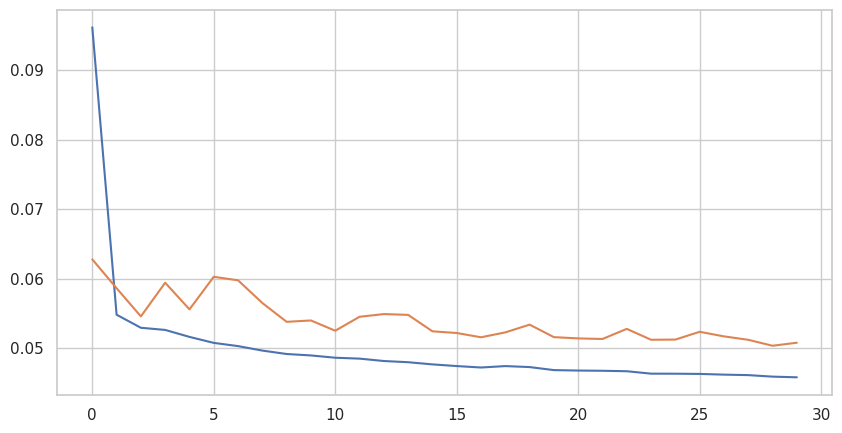

In [ ]:
loss_per_epoch = modelLSTM.history.history['loss']
val_loss_per_epoch = modelLSTM.history.history['val_loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)
plt.plot(range(len(val_loss_per_epoch)),val_loss_per_epoch)

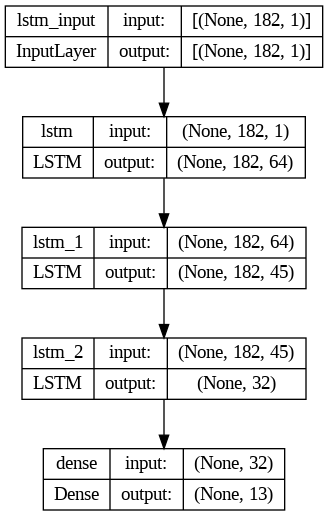

In [ ]:
img_LSTM = 'model_LSTM.png'
tf.keras.utils.plot_model(modelLSTM, to_file=img_LSTM, show_shapes=True)

### Test

In [ ]:
modelLSTM = keras.models.load_model('best_modelLSTM.h5')

In [ ]:
pred_LSTM = scaler.inverse_transform(modelLSTM.predict(X_train_LSTM))
real_data = scaler.inverse_transform(y_train_LSTM)

pred_LSTM = np.clip(pred_LSTM, a_min=0, a_max=None)

563/563 [==============================] - 5s 8ms/step


In [ ]:
print(pred_LSTM.shape[0])

18006


In [ ]:
# estimate errors
mse22 = mean_squared_error(real_data, pred_LSTM)
rmse22 = np.sqrt(mse22)
p_rmse22 = (rmse22 / 250) * 100
mae22 = mean_absolute_error(real_data, pred_LSTM)
p_mae22 = (mae22 / 250) * 100
r222 = r2_score(real_data, pred_LSTM)

# print errors
print("Root Mean Square Error:", rmse22)
print('P RMSE: %f' % p_rmse22)
print('------')
print('MSE:', mse22)
print('------')
print('MAE:', mae22)
print('P MAE: %f' % p_mae22)
print('------')
print('R2 Score: %f' % r222)

Root Mean Square Error: 32.56007852519211
P RMSE: 13.024031
------
MSE: 1060.1587135666764
------
MAE: 21.974139925614903
P MAE: 8.789656
------
R2 Score: 0.855153


In [ ]:
# Plotting the results
datos2=np.array(range(0, 18006))

fig3 = go.Figure()
fig3 = make_subplots(rows=1, cols=1)
fig3.add_trace(go.Scatter(x=datos2, y=real_data[:,0],
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig3.add_trace(go.Scatter(x=datos2, y=pred_LSTM[:,0],
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig3.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=600,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=23, font_color='black'),
                  showlegend=True)
fig3.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig3.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig3.show()

In [ ]:
datos2=np.array(range(0, 18006))

fig3 = go.Figure()
fig3 = make_subplots(rows=1, cols=1)
fig3.add_trace(go.Scatter(x=datos2, y=real_data[2000-182:2000,0],
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig3.add_trace(go.Scatter(x=datos2, y=pred_LSTM[2000-182:2000,0],
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig3.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=500,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='black'),
                  showlegend=True)
fig3.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig3.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig3.show()

## Model 3: XGBoost

### Train

In [ ]:
trainXG = train.copy()

In [ ]:
seq_length = 13*14
out_length = 13

In [ ]:
data_train_XG = series_to_supervised(trainXG, seq_length, out_length)
print(data_train_XG.shape)

(18006, 195)


In [ ]:
X_train_XG = data_train_XG.values[:, 0:seq_length]
y_train_XG = data_train_XG.values[:, seq_length:]
print(X_train_XG.shape, y_train_XG.shape)

(18006, 182) (18006, 13)


In [ ]:
# Specify window size
window_size = 13*14

all_predictionsXG = []
all_test_dataXG = []


# Split the time series into windows
n_windows = int(len(y_train_XG) / window_size)
for i in range(n_windows):
    train_XG = y_train_XG[i*window_size : (i+1)*window_size]

    X_trainXG = train_XG.copy()
    y_trainXG = train_XG.copy()

    # Create a XGBoost model
    modelXG = XGBRegressor(objective= 'reg:squarederror',  # objective function for regression problems
    learning_rate= 0.1,  # learning rate
    max_depth= 3,  # maximum depth of tree
    n_estimators= 100  # number of trees in the model
    )

    # Fit the model to the training data
    resultsXG = modelXG.fit(X_trainXG, y_trainXG)

    # Perform forecast for validation data
    predictionsXG = resultsXG.predict(X_trainXG)
    print(predictionsXG.shape)

    # Store forecast and validation results in the corresponding lists
    all_predictionsXG.extend(predictionsXG[:,0])
    all_test_dataXG.extend(y_trainXG[:,0].tolist())

    # Display training data and forecasting data
    datos4=np.array(range(0, 182))

    fig = go.Figure()
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(go.Scatter(x=datos4, y=y_trainXG[:,0],
                    mode='lines', line=dict(width=2.5, color='#145DA0'), name="Training data", stackgaps='infer zero'), row=1, col=1)
    fig.add_trace(go.Scatter(x=datos4, y=predictionsXG[:,0],
                    mode='lines', line=dict(width=2.5, color='#EC7C30'), name="Forecast", stackgaps='infer zero'), row=1, col=1)
    fig.update_layout(title='',
                      paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)',
                      width=1200,height=500,
                      yaxis=dict(color="black"),
                      xaxis=dict(color="black"),
                      font=dict(family="Fira Sans, Condensed", color='black'),
                      legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='black'),
                      showlegend=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
    fig.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
    fig.show()

    # Calculate errors for current window
    mse = mean_squared_error(train_XG, predictionsXG)
    mae = mean_absolute_error(train_XG, predictionsXG)
    p_mae = (mae / 250) * 100
    rmse = np.sqrt(mse)
    p_rmse = (rmse / 250) * 100
    r2 = r2_score(train_XG, predictionsXG)

    print("Root Mean Square Error:", rmse)
    print('P RMSE: %f' % p_rmse)
    print('------')
    print('MSE: %f' % mse)
    print('------')
    print('MAE: %f' % mae)
    print('P MAE: %f' % p_mae)
    print('------')
    print('R2 Score: %f' % r2)
    print(i)


(182, 13)


Root Mean Square Error: 0.18390287122938842
P RMSE: 0.073561
------
MSE: 0.033820
------
MAE: 0.121664
P MAE: 0.048666
------
R2 Score: 0.999995
0
(182, 13)


Root Mean Square Error: 0.17059829999923123
P RMSE: 0.068239
------
MSE: 0.029104
------
MAE: 0.117645
P MAE: 0.047058
------
R2 Score: 0.999995
1
(182, 13)


Root Mean Square Error: 0.21241942645544565
P RMSE: 0.084968
------
MSE: 0.045122
------
MAE: 0.147897
P MAE: 0.059159
------
R2 Score: 0.999992
2
(182, 13)


Root Mean Square Error: 0.18964158676400866
P RMSE: 0.075857
------
MSE: 0.035964
------
MAE: 0.133144
P MAE: 0.053257
------
R2 Score: 0.999994
3
(182, 13)


Root Mean Square Error: 0.17729089258773165
P RMSE: 0.070916
------
MSE: 0.031432
------
MAE: 0.122021
P MAE: 0.048808
------
R2 Score: 0.999995
4
(182, 13)


Root Mean Square Error: 0.21323803870619812
P RMSE: 0.085295
------
MSE: 0.045470
------
MAE: 0.142059
P MAE: 0.056823
------
R2 Score: 0.999994
5
(182, 13)


Root Mean Square Error: 0.16189023214624879
P RMSE: 0.064756
------
MSE: 0.026208
------
MAE: 0.112454
P MAE: 0.044981
------
R2 Score: 0.999996
6
(182, 13)


Root Mean Square Error: 0.18992764978097307
P RMSE: 0.075971
------
MSE: 0.036073
------
MAE: 0.130652
P MAE: 0.052261
------
R2 Score: 0.999995
7
(182, 13)


Root Mean Square Error: 0.2002599155667709
P RMSE: 0.080104
------
MSE: 0.040104
------
MAE: 0.133552
P MAE: 0.053421
------
R2 Score: 0.999995
8
(182, 13)


Root Mean Square Error: 0.20041919755503965
P RMSE: 0.080168
------
MSE: 0.040168
------
MAE: 0.134735
P MAE: 0.053894
------
R2 Score: 0.999995
9
(182, 13)


Root Mean Square Error: 0.2041072477527049
P RMSE: 0.081643
------
MSE: 0.041660
------
MAE: 0.138575
P MAE: 0.055430
------
R2 Score: 0.999995
10
(182, 13)


Root Mean Square Error: 0.21564287604441632
P RMSE: 0.086257
------
MSE: 0.046502
------
MAE: 0.150910
P MAE: 0.060364
------
R2 Score: 0.999994
11
(182, 13)


Root Mean Square Error: 0.20797830380594967
P RMSE: 0.083191
------
MSE: 0.043255
------
MAE: 0.136898
P MAE: 0.054759
------
R2 Score: 0.999994
12
(182, 13)


Root Mean Square Error: 0.21559747146143943
P RMSE: 0.086239
------
MSE: 0.046482
------
MAE: 0.143194
P MAE: 0.057278
------
R2 Score: 0.999994
13
(182, 13)


Root Mean Square Error: 0.19498648950940184
P RMSE: 0.077995
------
MSE: 0.038020
------
MAE: 0.122085
P MAE: 0.048834
------
R2 Score: 0.999996
14
(182, 13)


Root Mean Square Error: 0.199752110380994
P RMSE: 0.079901
------
MSE: 0.039901
------
MAE: 0.129503
P MAE: 0.051801
------
R2 Score: 0.999995
15
(182, 13)


Root Mean Square Error: 0.1642173488244209
P RMSE: 0.065687
------
MSE: 0.026967
------
MAE: 0.107579
P MAE: 0.043032
------
R2 Score: 0.999997
16
(182, 13)


Root Mean Square Error: 0.16557705925738767
P RMSE: 0.066231
------
MSE: 0.027416
------
MAE: 0.109603
P MAE: 0.043841
------
R2 Score: 0.999996
17
(182, 13)


Root Mean Square Error: 0.19618229470921916
P RMSE: 0.078473
------
MSE: 0.038487
------
MAE: 0.133659
P MAE: 0.053464
------
R2 Score: 0.999995
18
(182, 13)


Root Mean Square Error: 0.23897672126634992
P RMSE: 0.095591
------
MSE: 0.057110
------
MAE: 0.162387
P MAE: 0.064955
------
R2 Score: 0.999993
19
(182, 13)


Root Mean Square Error: 0.232520684616276
P RMSE: 0.093008
------
MSE: 0.054066
------
MAE: 0.158011
P MAE: 0.063204
------
R2 Score: 0.999994
20
(182, 13)


Root Mean Square Error: 0.20524527061837208
P RMSE: 0.082098
------
MSE: 0.042126
------
MAE: 0.134067
P MAE: 0.053627
------
R2 Score: 0.999995
21
(182, 13)


Root Mean Square Error: 0.2472641132267849
P RMSE: 0.098906
------
MSE: 0.061140
------
MAE: 0.157845
P MAE: 0.063138
------
R2 Score: 0.999993
22
(182, 13)


Root Mean Square Error: 0.22529206107255811
P RMSE: 0.090117
------
MSE: 0.050757
------
MAE: 0.154508
P MAE: 0.061803
------
R2 Score: 0.999994
23
(182, 13)


Root Mean Square Error: 0.219489413501252
P RMSE: 0.087796
------
MSE: 0.048176
------
MAE: 0.147754
P MAE: 0.059102
------
R2 Score: 0.999994
24
(182, 13)


Root Mean Square Error: 0.2092243769188203
P RMSE: 0.083690
------
MSE: 0.043775
------
MAE: 0.143418
P MAE: 0.057367
------
R2 Score: 0.999993
25
(182, 13)


Root Mean Square Error: 0.185355853899519
P RMSE: 0.074142
------
MSE: 0.034357
------
MAE: 0.126107
P MAE: 0.050443
------
R2 Score: 0.999996
26
(182, 13)


Root Mean Square Error: 0.22920333048149305
P RMSE: 0.091681
------
MSE: 0.052534
------
MAE: 0.156711
P MAE: 0.062684
------
R2 Score: 0.999993
27
(182, 13)


Root Mean Square Error: 0.20592100797378593
P RMSE: 0.082368
------
MSE: 0.042403
------
MAE: 0.138787
P MAE: 0.055515
------
R2 Score: 0.999993
28
(182, 13)


Root Mean Square Error: 0.258898274400784
P RMSE: 0.103559
------
MSE: 0.067028
------
MAE: 0.169477
P MAE: 0.067791
------
R2 Score: 0.999992
29
(182, 13)


Root Mean Square Error: 0.194953568243092
P RMSE: 0.077981
------
MSE: 0.038007
------
MAE: 0.130471
P MAE: 0.052188
------
R2 Score: 0.999995
30
(182, 13)


Root Mean Square Error: 0.20303128159791395
P RMSE: 0.081213
------
MSE: 0.041222
------
MAE: 0.140915
P MAE: 0.056366
------
R2 Score: 0.999994
31
(182, 13)


Root Mean Square Error: 0.18995184230664183
P RMSE: 0.075981
------
MSE: 0.036082
------
MAE: 0.127806
P MAE: 0.051122
------
R2 Score: 0.999995
32
(182, 13)


Root Mean Square Error: 0.20160061042210511
P RMSE: 0.080640
------
MSE: 0.040643
------
MAE: 0.135719
P MAE: 0.054288
------
R2 Score: 0.999995
33
(182, 13)


Root Mean Square Error: 0.23316079725080888
P RMSE: 0.093264
------
MSE: 0.054364
------
MAE: 0.159722
P MAE: 0.063889
------
R2 Score: 0.999994
34
(182, 13)


Root Mean Square Error: 0.22853190412206176
P RMSE: 0.091413
------
MSE: 0.052227
------
MAE: 0.156855
P MAE: 0.062742
------
R2 Score: 0.999993
35
(182, 13)


Root Mean Square Error: 0.07199742213283039
P RMSE: 0.028799
------
MSE: 0.005184
------
MAE: 0.044447
P MAE: 0.017779
------
R2 Score: 0.999999
36
(182, 13)


Root Mean Square Error: 0.08169693517817027
P RMSE: 0.032679
------
MSE: 0.006674
------
MAE: 0.054199
P MAE: 0.021679
------
R2 Score: 0.999999
37
(182, 13)


Root Mean Square Error: 0.061497980869150856
P RMSE: 0.024599
------
MSE: 0.003782
------
MAE: 0.036578
P MAE: 0.014631
------
R2 Score: 0.999999
38
(182, 13)


Root Mean Square Error: 0.07970598038695165
P RMSE: 0.031882
------
MSE: 0.006353
------
MAE: 0.048011
P MAE: 0.019204
------
R2 Score: 0.999999
39
(182, 13)


Root Mean Square Error: 0.21682857501522815
P RMSE: 0.086731
------
MSE: 0.047015
------
MAE: 0.129432
P MAE: 0.051773
------
R2 Score: 0.999994
40
(182, 13)


Root Mean Square Error: 0.19615743675755268
P RMSE: 0.078463
------
MSE: 0.038478
------
MAE: 0.132206
P MAE: 0.052882
------
R2 Score: 0.999994
41
(182, 13)


Root Mean Square Error: 0.20764281655944192
P RMSE: 0.083057
------
MSE: 0.043116
------
MAE: 0.136779
P MAE: 0.054712
------
R2 Score: 0.999994
42
(182, 13)


Root Mean Square Error: 0.17496145911542846
P RMSE: 0.069985
------
MSE: 0.030612
------
MAE: 0.113170
P MAE: 0.045268
------
R2 Score: 0.999996
43
(182, 13)


Root Mean Square Error: 0.2101063156255658
P RMSE: 0.084043
------
MSE: 0.044145
------
MAE: 0.132487
P MAE: 0.052995
------
R2 Score: 0.999994
44
(182, 13)


Root Mean Square Error: 0.11294037876998288
P RMSE: 0.045176
------
MSE: 0.012756
------
MAE: 0.071579
P MAE: 0.028632
------
R2 Score: 0.999998
45
(182, 13)


Root Mean Square Error: 0.10307682082182908
P RMSE: 0.041231
------
MSE: 0.010625
------
MAE: 0.059430
P MAE: 0.023772
------
R2 Score: 0.999999
46
(182, 13)


Root Mean Square Error: 0.06659177135084846
P RMSE: 0.026637
------
MSE: 0.004434
------
MAE: 0.042515
P MAE: 0.017006
------
R2 Score: 0.999999
47
(182, 13)


Root Mean Square Error: 0.07890062525279651
P RMSE: 0.031560
------
MSE: 0.006225
------
MAE: 0.050402
P MAE: 0.020161
------
R2 Score: 0.999999
48
(182, 13)


Root Mean Square Error: 0.2128694642546213
P RMSE: 0.085148
------
MSE: 0.045313
------
MAE: 0.143670
P MAE: 0.057468
------
R2 Score: 0.999994
49
(182, 13)


Root Mean Square Error: 0.19549308924580783
P RMSE: 0.078197
------
MSE: 0.038218
------
MAE: 0.135832
P MAE: 0.054333
------
R2 Score: 0.999995
50
(182, 13)


Root Mean Square Error: 0.18771336857405493
P RMSE: 0.075085
------
MSE: 0.035236
------
MAE: 0.125595
P MAE: 0.050238
------
R2 Score: 0.999994
51
(182, 13)


Root Mean Square Error: 0.16992039960139008
P RMSE: 0.067968
------
MSE: 0.028873
------
MAE: 0.115809
P MAE: 0.046323
------
R2 Score: 0.999995
52
(182, 13)


Root Mean Square Error: 0.19450531938300927
P RMSE: 0.077802
------
MSE: 0.037832
------
MAE: 0.130748
P MAE: 0.052299
------
R2 Score: 0.999993
53
(182, 13)


Root Mean Square Error: 0.2513200543648424
P RMSE: 0.100528
------
MSE: 0.063162
------
MAE: 0.160976
P MAE: 0.064391
------
R2 Score: 0.999992
54
(182, 13)


Root Mean Square Error: 0.20511014455046492
P RMSE: 0.082044
------
MSE: 0.042070
------
MAE: 0.139958
P MAE: 0.055983
------
R2 Score: 0.999994
55
(182, 13)


Root Mean Square Error: 0.26226333572585936
P RMSE: 0.104905
------
MSE: 0.068782
------
MAE: 0.172839
P MAE: 0.069136
------
R2 Score: 0.999991
56
(182, 13)


Root Mean Square Error: 0.21511970375018052
P RMSE: 0.086048
------
MSE: 0.046276
------
MAE: 0.146798
P MAE: 0.058719
------
R2 Score: 0.999995
57
(182, 13)


Root Mean Square Error: 0.1620572158176552
P RMSE: 0.064823
------
MSE: 0.026263
------
MAE: 0.113068
P MAE: 0.045227
------
R2 Score: 0.999996
58
(182, 13)


Root Mean Square Error: 0.20958347821553075
P RMSE: 0.083833
------
MSE: 0.043925
------
MAE: 0.144821
P MAE: 0.057929
------
R2 Score: 0.999994
59
(182, 13)


Root Mean Square Error: 0.21125697764705612
P RMSE: 0.084503
------
MSE: 0.044630
------
MAE: 0.144737
P MAE: 0.057895
------
R2 Score: 0.999995
60
(182, 13)


Root Mean Square Error: 0.2177448656601219
P RMSE: 0.087098
------
MSE: 0.047413
------
MAE: 0.149932
P MAE: 0.059973
------
R2 Score: 0.999995
61
(182, 13)


Root Mean Square Error: 0.22929333366953197
P RMSE: 0.091717
------
MSE: 0.052575
------
MAE: 0.153865
P MAE: 0.061546
------
R2 Score: 0.999994
62
(182, 13)


Root Mean Square Error: 0.22963235353943634
P RMSE: 0.091853
------
MSE: 0.052731
------
MAE: 0.151767
P MAE: 0.060707
------
R2 Score: 0.999994
63
(182, 13)


Root Mean Square Error: 0.20093997442281203
P RMSE: 0.080376
------
MSE: 0.040377
------
MAE: 0.133258
P MAE: 0.053303
------
R2 Score: 0.999996
64
(182, 13)


Root Mean Square Error: 0.2327433217958609
P RMSE: 0.093097
------
MSE: 0.054169
------
MAE: 0.156802
P MAE: 0.062721
------
R2 Score: 0.999993
65
(182, 13)


Root Mean Square Error: 0.20206089914338424
P RMSE: 0.080824
------
MSE: 0.040829
------
MAE: 0.137812
P MAE: 0.055125
------
R2 Score: 0.999994
66
(182, 13)


Root Mean Square Error: 0.16212464180416042
P RMSE: 0.064850
------
MSE: 0.026284
------
MAE: 0.111562
P MAE: 0.044625
------
R2 Score: 0.999997
67
(182, 13)


Root Mean Square Error: 0.19727850397370086
P RMSE: 0.078911
------
MSE: 0.038919
------
MAE: 0.132569
P MAE: 0.053028
------
R2 Score: 0.999994
68
(182, 13)


Root Mean Square Error: 0.1310681238200948
P RMSE: 0.052427
------
MSE: 0.017179
------
MAE: 0.076781
P MAE: 0.030712
------
R2 Score: 0.999997
69
(182, 13)


Root Mean Square Error: 0.07431792152091114
P RMSE: 0.029727
------
MSE: 0.005523
------
MAE: 0.049015
P MAE: 0.019606
------
R2 Score: 0.999999
70
(182, 13)


Root Mean Square Error: 0.08319947288476172
P RMSE: 0.033280
------
MSE: 0.006922
------
MAE: 0.049697
P MAE: 0.019879
------
R2 Score: 0.999999
71
(182, 13)


Root Mean Square Error: 0.15351575382364277
P RMSE: 0.061406
------
MSE: 0.023567
------
MAE: 0.098133
P MAE: 0.039253
------
R2 Score: 0.999996
72
(182, 13)


Root Mean Square Error: 0.20380870730208014
P RMSE: 0.081523
------
MSE: 0.041538
------
MAE: 0.136273
P MAE: 0.054509
------
R2 Score: 0.999989
73
(182, 13)


Root Mean Square Error: 0.18486071829879866
P RMSE: 0.073944
------
MSE: 0.034173
------
MAE: 0.122528
P MAE: 0.049011
------
R2 Score: 0.999996
74
(182, 13)


Root Mean Square Error: 0.17767406143600092
P RMSE: 0.071070
------
MSE: 0.031568
------
MAE: 0.123239
P MAE: 0.049296
------
R2 Score: 0.999995
75
(182, 13)


Root Mean Square Error: 0.1999499470998767
P RMSE: 0.079980
------
MSE: 0.039980
------
MAE: 0.137698
P MAE: 0.055079
------
R2 Score: 0.999994
76
(182, 13)


Root Mean Square Error: 0.19604464039989433
P RMSE: 0.078418
------
MSE: 0.038434
------
MAE: 0.134121
P MAE: 0.053649
------
R2 Score: 0.999993
77
(182, 13)


Root Mean Square Error: 0.19451611999526908
P RMSE: 0.077806
------
MSE: 0.037837
------
MAE: 0.131064
P MAE: 0.052426
------
R2 Score: 0.999993
78
(182, 13)


Root Mean Square Error: 0.21314249835711135
P RMSE: 0.085257
------
MSE: 0.045430
------
MAE: 0.140109
P MAE: 0.056044
------
R2 Score: 0.999992
79
(182, 13)


Root Mean Square Error: 0.17049581876628608
P RMSE: 0.068198
------
MSE: 0.029069
------
MAE: 0.114230
P MAE: 0.045692
------
R2 Score: 0.999995
80
(182, 13)


Root Mean Square Error: 0.23704893018361012
P RMSE: 0.094820
------
MSE: 0.056192
------
MAE: 0.154026
P MAE: 0.061610
------
R2 Score: 0.999990
81
(182, 13)


Root Mean Square Error: 0.20501622087301535
P RMSE: 0.082006
------
MSE: 0.042032
------
MAE: 0.136611
P MAE: 0.054644
------
R2 Score: 0.999993
82
(182, 13)


Root Mean Square Error: 0.16454599754656793
P RMSE: 0.065818
------
MSE: 0.027075
------
MAE: 0.110315
P MAE: 0.044126
------
R2 Score: 0.999995
83
(182, 13)


Root Mean Square Error: 0.19969405205205365
P RMSE: 0.079878
------
MSE: 0.039878
------
MAE: 0.136169
P MAE: 0.054468
------
R2 Score: 0.999992
84
(182, 13)


Root Mean Square Error: 0.22767553752123537
P RMSE: 0.091070
------
MSE: 0.051836
------
MAE: 0.146406
P MAE: 0.058562
------
R2 Score: 0.999991
85
(182, 13)


Root Mean Square Error: 0.181518612360067
P RMSE: 0.072607
------
MSE: 0.032949
------
MAE: 0.121499
P MAE: 0.048600
------
R2 Score: 0.999995
86
(182, 13)


Root Mean Square Error: 0.16509772299780445
P RMSE: 0.066039
------
MSE: 0.027257
------
MAE: 0.113173
P MAE: 0.045269
------
R2 Score: 0.999996
87
(182, 13)


Root Mean Square Error: 0.20077787356459317
P RMSE: 0.080311
------
MSE: 0.040312
------
MAE: 0.141600
P MAE: 0.056640
------
R2 Score: 0.999994
88
(182, 13)


Root Mean Square Error: 0.16797586868740125
P RMSE: 0.067190
------
MSE: 0.028216
------
MAE: 0.114443
P MAE: 0.045777
------
R2 Score: 0.999996
89
(182, 13)


Root Mean Square Error: 0.17316390824551664
P RMSE: 0.069266
------
MSE: 0.029986
------
MAE: 0.116154
P MAE: 0.046462
------
R2 Score: 0.999995
90
(182, 13)


Root Mean Square Error: 0.22822641499533047
P RMSE: 0.091291
------
MSE: 0.052087
------
MAE: 0.157623
P MAE: 0.063049
------
R2 Score: 0.999991
91
(182, 13)


Root Mean Square Error: 0.18091349791700984
P RMSE: 0.072365
------
MSE: 0.032730
------
MAE: 0.124295
P MAE: 0.049718
------
R2 Score: 0.999995
92
(182, 13)


Root Mean Square Error: 0.19260380995963067
P RMSE: 0.077042
------
MSE: 0.037096
------
MAE: 0.126064
P MAE: 0.050426
------
R2 Score: 0.999993
93
(182, 13)


Root Mean Square Error: 0.18134786311728682
P RMSE: 0.072539
------
MSE: 0.032887
------
MAE: 0.116528
P MAE: 0.046611
------
R2 Score: 0.999994
94
(182, 13)


Root Mean Square Error: 0.15136630906923818
P RMSE: 0.060547
------
MSE: 0.022912
------
MAE: 0.100258
P MAE: 0.040103
------
R2 Score: 0.999996
95
(182, 13)


Root Mean Square Error: 0.21207034314188195
P RMSE: 0.084828
------
MSE: 0.044974
------
MAE: 0.138693
P MAE: 0.055477
------
R2 Score: 0.999993
96
(182, 13)


Root Mean Square Error: 0.21509281734671273
P RMSE: 0.086037
------
MSE: 0.046265
------
MAE: 0.140695
P MAE: 0.056278
------
R2 Score: 0.999993
97


In [148]:
modelXG.save_model("xgboost.json")

In [149]:
modelXG2 = xgb.Booster()
modelXG2.load_model("xgboost.json")

In [150]:
all_predictionsXG = np.clip(all_predictionsXG, a_min=0, a_max=None)


# Calculate errors for all validation data
mse3 = mean_squared_error(all_test_dataXG, all_predictionsXG)
mae3 = mean_absolute_error(all_test_dataXG, all_predictionsXG)
p_mae3 = (mae3 / 250) * 100
rmse3 = np.sqrt(mse3)
p_rmse3 = (rmse3 / 250) * 100
r23 = r2_score(all_test_dataXG, all_predictionsXG)

print("Root Mean Square Error:", rmse3)
print('P RMSE: %f' % p_rmse3)
print('------')
print('MSE: %f' % mse3)
print('------')
print('MAE: %f' % mae3)
print('P MAE: %f' % p_mae3)
print('------')
print('R2 Score: %f' % r23)

Root Mean Square Error: 0.1928611542420144
P RMSE: 0.077144
------
MSE: 0.037195
------
MAE: 0.125466
P MAE: 0.050187
------
R2 Score: 0.999995


In [151]:
datos5=np.array(range(0, 18200))

fig5 = go.Figure()
fig5 = make_subplots(rows=1, cols=1)
fig5.add_trace(go.Scatter(x=datos5, y=all_test_dataXG,
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig5.add_trace(go.Scatter(x=datos5, y=all_predictionsXG,
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig5.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=500,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=23, font_color='black'),
                  showlegend=True)
fig5.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig5.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig5.show()

# Model Validation

### SARIMA

In [152]:
testSARIMA = test.copy()

In [153]:
predictions = resultsSARIMA.predict(start=len(train_data), end=len(train_data)+len(testSARIMA)-1, dynamic=False)
print(predictions.shape)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



(4745,)


In [154]:
window_size = 13*14

all_predictions2 = []
all_test_data2 = []

n_windows = int(len(testSARIMA) / window_size)
for i in range(n_windows):

    train_data2 = testSARIMA.iloc[i*window_size : (i+1)*window_size]

    # Forecast validation data
    predictions = resultsSARIMA.predict(start=0, end=len(train_data2)-1, dynamic=False)
    print(predictions.shape)

    # Store forecast and validation results in the corresponding lists
    all_predictions2.extend(predictions)
    all_test_data2.extend(train_data2['Generacion_(kWh)'].tolist())

    # Display validation and forecast data
    fig = go.Figure()
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(go.Scatter(x=train_data2.index, y=train_data2["Generacion_(kWh)"],
                    mode='lines', line=dict(width=2.5, color='#145DA0'), name="Validation data", stackgaps='infer zero'), row=1, col=1)
    fig.add_trace(go.Scatter(x=train_data2.index, y=predictionsSARIMA,
                    mode='lines', line=dict(width=2.5, color='#EC7C30'), name="Forecast", stackgaps='infer zero'), row=1, col=1)
    fig.update_layout(title='',
                      paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)',
                      width=1200,height=500,
                      yaxis=dict(color="black"),
                      xaxis=dict(color="black"),
                      font=dict(family="Fira Sans, Condensed", color='black'),
                      legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='black'),
                      showlegend=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
    fig.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
    fig.show()


    # Calculate errors for the current window
    mse = mean_squared_error(train_data2, predictions)
    mae = mean_absolute_error(train_data2, predictions)
    p_mae = (mae / 250) * 100
    rmse = np.sqrt(mse)
    p_rmse = (rmse / 250) * 100
    r2 = r2_score(train_data2, predictions)

    print("Root Mean Square Error:", rmse)
    print('P RMSE: %f' % p_rmse)
    print('------')
    print('MSE: %f' % mse)
    print('------')
    print('MAE: %f' % mae)
    print('P MAE: %f' % p_mae)
    print('------')
    print('R2 Score: %f' % r2)

(182,)


Root Mean Square Error: 43.81864349379122
P RMSE: 17.527457
------
MSE: 1920.073518
------
MAE: 33.011063
P MAE: 13.204425
------
R2 Score: 0.724049
(182,)


Root Mean Square Error: 41.122831817462895
P RMSE: 16.449133
------
MSE: 1691.087297
------
MAE: 30.101750
P MAE: 12.040700
------
R2 Score: 0.745804
(182,)


Root Mean Square Error: 46.71385984280878
P RMSE: 18.685544
------
MSE: 2182.184701
------
MAE: 33.927021
P MAE: 13.570808
------
R2 Score: 0.687986
(182,)


Root Mean Square Error: 54.75429469273123
P RMSE: 21.901718
------
MSE: 2998.032787
------
MAE: 38.783186
P MAE: 15.513274
------
R2 Score: 0.466158
(182,)


Root Mean Square Error: 47.62682140332646
P RMSE: 19.050729
------
MSE: 2268.314117
------
MAE: 36.094525
P MAE: 14.437810
------
R2 Score: 0.611027
(182,)


Root Mean Square Error: 45.63820592825698
P RMSE: 18.255282
------
MSE: 2082.845840
------
MAE: 33.693128
P MAE: 13.477251
------
R2 Score: 0.634502
(182,)


Root Mean Square Error: 49.15153861225424
P RMSE: 19.660615
------
MSE: 2415.873748
------
MAE: 35.128183
P MAE: 14.051273
------
R2 Score: 0.552255
(182,)


Root Mean Square Error: 38.58560226848307
P RMSE: 15.434241
------
MSE: 1488.848702
------
MAE: 29.114105
P MAE: 11.645642
------
R2 Score: 0.748885
(182,)


Root Mean Square Error: 38.44573653112647
P RMSE: 15.378295
------
MSE: 1478.074657
------
MAE: 28.731297
P MAE: 11.492519
------
R2 Score: 0.774131
(182,)


Root Mean Square Error: 45.909216051457065
P RMSE: 18.363686
------
MSE: 2107.656118
------
MAE: 34.111513
P MAE: 13.644605
------
R2 Score: 0.582359
(182,)


Root Mean Square Error: 38.88998189512612
P RMSE: 15.555993
------
MSE: 1512.430692
------
MAE: 28.437385
P MAE: 11.374954
------
R2 Score: 0.715513
(182,)


Root Mean Square Error: 41.559210070179205
P RMSE: 16.623684
------
MSE: 1727.167942
------
MAE: 30.349296
P MAE: 12.139718
------
R2 Score: 0.630838
(182,)


Root Mean Square Error: 36.98409734265607
P RMSE: 14.793639
------
MSE: 1367.823456
------
MAE: 27.347742
P MAE: 10.939097
------
R2 Score: 0.755373
(182,)


Root Mean Square Error: 40.16855754383144
P RMSE: 16.067423
------
MSE: 1613.513015
------
MAE: 30.797984
P MAE: 12.319193
------
R2 Score: 0.705430
(182,)


Root Mean Square Error: 48.06638316658868
P RMSE: 19.226553
------
MSE: 2310.377191
------
MAE: 35.596098
P MAE: 14.238439
------
R2 Score: 0.564664
(182,)


Root Mean Square Error: 41.213387095858586
P RMSE: 16.485355
------
MSE: 1698.543276
------
MAE: 31.258754
P MAE: 12.503502
------
R2 Score: 0.718978
(182,)


Root Mean Square Error: 42.882428202818126
P RMSE: 17.152971
------
MSE: 1838.902649
------
MAE: 31.258408
P MAE: 12.503363
------
R2 Score: 0.631330
(182,)


Root Mean Square Error: 53.90203461068958
P RMSE: 21.560814
------
MSE: 2905.429335
------
MAE: 37.883741
P MAE: 15.153496
------
R2 Score: 0.400518
(182,)


Root Mean Square Error: 47.14983680654621
P RMSE: 18.859935
------
MSE: 2223.107111
------
MAE: 32.684657
P MAE: 13.073863
------
R2 Score: 0.564203
(182,)


Root Mean Square Error: 57.611872316223284
P RMSE: 23.044749
------
MSE: 3319.127832
------
MAE: 41.645463
P MAE: 16.658185
------
R2 Score: 0.050420
(182,)


Root Mean Square Error: 36.808166787185776
P RMSE: 14.723267
------
MSE: 1354.841142
------
MAE: 26.472831
P MAE: 10.589132
------
R2 Score: 0.761616
(182,)


Root Mean Square Error: 40.30921206547288
P RMSE: 16.123685
------
MSE: 1624.832577
------
MAE: 29.645339
P MAE: 11.858135
------
R2 Score: 0.694076
(182,)


Root Mean Square Error: 42.91064830813196
P RMSE: 17.164259
------
MSE: 1841.323738
------
MAE: 30.721090
P MAE: 12.288436
------
R2 Score: 0.655521
(182,)


Root Mean Square Error: 38.20154518451306
P RMSE: 15.280618
------
MSE: 1459.358054
------
MAE: 25.179463
P MAE: 10.071785
------
R2 Score: 0.758855
(182,)


Root Mean Square Error: 33.64139893071327
P RMSE: 13.456560
------
MSE: 1131.743722
------
MAE: 24.726707
P MAE: 9.890683
------
R2 Score: 0.793744
(182,)


Root Mean Square Error: 48.44819139913359
P RMSE: 19.379277
------
MSE: 2347.227250
------
MAE: 33.718013
P MAE: 13.487205
------
R2 Score: 0.495027


In [155]:
all_predictions2 = np.clip(all_predictions2, a_min=0, a_max=None)

# Calculate errors for all validation data
mseS = mean_squared_error(all_test_data2, all_predictions2)
maeS = mean_absolute_error(all_test_data2, all_predictions2)
p_maeS = (maeS / 250) * 100
rmseS = np.sqrt(mseS)
p_rmseS = (rmseS / 250) * 100
r2S = r2_score(all_test_data2, all_predictions2)

print("Root Mean Square Error:", rmseS)
print('P RMSE: %f' % p_rmseS)
print('------')
print('MSE: %f' % mseS)
print('------')
print('MAE: %f' % maeS)
print('P MAE: %f' % p_maeS)
print('------')
print('R2 Score: %f' % r2S)

Root Mean Square Error: 44.046666361933546
P RMSE: 17.618667
------
MSE: 1940.108818
------
MAE: 30.934649
P MAE: 12.373860
------
R2 Score: 0.652983


In [156]:
datos1=np.array(range(0, 4732))

fig2 = go.Figure()
fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=datos1, y=all_test_data2,
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig2.add_trace(go.Scatter(x=datos1, y=all_predictions2,
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig2.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=600,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=23, font_color='black'),
                  showlegend=True)
fig2.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig2.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig2.show()

## LSTM

In [157]:
testLSTM = test.copy()

In [158]:
# Normalize data
scaler = MinMaxScaler(feature_range=(-1,1))
DatosM2nV = scaler.fit_transform(testLSTM)

seq_length = 13*14
out_length = 13

In [159]:
data_train_LSTM_V = series_to_supervised(DatosM2nV, seq_length, out_length)
print(data_train_LSTM_V.shape)

(4551, 195)


In [160]:
X_train_LSTM_V = data_train_LSTM_V.values[:, 0:seq_length]
y_train_LSTM_V = data_train_LSTM_V.values[:, seq_length:]
print(X_train_LSTM_V.shape, y_train_LSTM_V.shape)
X_train_LSTM_V= X_train_LSTM_V.reshape(X_train_LSTM_V.shape[0], X_train_LSTM_V.shape[1], 1)
print(X_train_LSTM_V.shape, y_train_LSTM_V.shape)


(4551, 182) (4551, 13)
(4551, 182, 1) (4551, 13)


In [164]:
model_LSTM_V = keras.models.load_model('best_modelLSTM.h5')

In [165]:
pred_LSTM_V = scaler.inverse_transform(model_LSTM_V.predict(X_train_LSTM_V))
real_data_V = scaler.inverse_transform(y_train_LSTM_V)

pred_LSTM_V = np.clip(pred_LSTM_V, a_min=0, a_max=None)

143/143 [==============================] - 2s 9ms/step


In [166]:
mse2L = mean_squared_error(real_data_V, pred_LSTM_V)
rmse2L = np.sqrt(mse2L)
p_rmse2L = (rmse2L / 250) * 100
mae2L = mean_absolute_error(real_data_V, pred_LSTM_V)
p_mae2L = (mae2L / 250) * 100
r22L = r2_score(real_data_V, pred_LSTM_V)

# print errors
print("Root Mean Square Error:", rmse2L)
print('P RMSE: %f' % p_rmse2L)
print('------')
print('MSE:', mse2L)
print('------')
print('MAE:', mae2L)
print('P MAE: %f' % p_mae2L)
print('------')
print('R2 Score: %f' % r22L)

Root Mean Square Error: 32.37716323370343
P RMSE: 12.950865
------
MSE: 1048.280699061877
------
MAE: 22.59732912747896
P MAE: 9.038932
------
R2 Score: 0.810411


In [167]:
datos3=np.array(range(0, 4745))

fig2 = go.Figure()
fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=datos3, y=real_data_V[:,0],
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig2.add_trace(go.Scatter(x=datos3, y=pred_LSTM_V[:,0],
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig2.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=500,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='black'),
                  showlegend=True)
fig2.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig2.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig2.show()

In [168]:
datos3=np.array(range(0, 4551))

fig2 = go.Figure()
fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=datos3, y=real_data_V[0:182,0],
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig2.add_trace(go.Scatter(x=datos3, y=pred_LSTM_V[0:182,0],
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig2.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=500,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=23, font_color='black'),
                  showlegend=True)
fig2.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig2.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig2.show()

## XGBoost

In [169]:
testXG = test.copy()

In [170]:
seq_length = 13*14
out_length = 13

In [171]:
data_vald_XG = series_to_supervised(testXG, seq_length, out_length)
print(data_vald_XG.shape)

(4551, 195)


In [172]:
X_val_XG = data_vald_XG.values[:, 0:seq_length]
y_val_XG = data_vald_XG.values[:, seq_length:]
print(X_val_XG.shape, y_val_XG.shape)

(4551, 182) (4551, 13)


In [173]:
window_size = 13*14

all_predictionsXG2 = []
all_test_dataXG2 = []


# Split the time series into windows
n_windows = int(len(y_val_XG) / window_size)
for i in range(n_windows):

    train_XG2 = y_val_XG[i*window_size : (i+1)*window_size]

    X_trainXG2 = train_XG2.copy()
    y_trainXG2 = train_XG2.copy()

    # Forecast for validation data

    predictionsXG2 = resultsXG.predict(X_trainXG2)
    print(predictionsXG2.shape)


    # Store forecast and validation results in the corresponding lists
    all_predictionsXG2.extend(predictionsXG2[:,0])
    all_test_dataXG2.extend(y_trainXG2[:,0].tolist())

    datos4=np.array(range(0, 182))

    fig = go.Figure()
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(go.Scatter(x=datos4, y=y_trainXG2[:,0],
                    mode='lines', line=dict(width=2.5, color='#145DA0'), name="Validation data", stackgaps='infer zero'), row=1, col=1)
    fig.add_trace(go.Scatter(x=datos4, y=predictionsXG2[:,0],
                    mode='lines', line=dict(width=2.5, color='#EC7C30'), name="Forecast", stackgaps='infer zero'), row=1, col=1)
    fig.update_layout(title='',
                      paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)',
                      width=1000,height=500,
                      yaxis=dict(color="black"),
                      xaxis=dict(color="black"),
                      font=dict(family="Fira Sans, Condensed", color='black'),
                      legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='black'),
                      showlegend=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
    fig.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
    fig.show()

    # Calculate errors for the current window
    mse = mean_squared_error(train_XG2, predictionsXG2)
    mae = mean_absolute_error(train_XG2, predictionsXG2)
    p_mae = (mae / 250) * 100
    rmse = np.sqrt(mse)
    p_rmse = (rmse / 250) * 100
    r2 = r2_score(train_XG2, predictionsXG2)

    print("Root Mean Square Error:", rmse)
    print('P RMSE: %f' % p_rmse)
    print('------')
    print('MSE: %f' % mse)
    print('------')
    print('MAE: %f' % mae)
    print('P MAE: %f' % p_mae)
    print('------')
    print('R2 Score: %f' % r2)

(182, 13)


Root Mean Square Error: 2.198112548227458
P RMSE: 0.879245
------
MSE: 4.831699
------
MAE: 1.384334
P MAE: 0.553734
------
R2 Score: 0.999257
(182, 13)


Root Mean Square Error: 2.4002510095872305
P RMSE: 0.960100
------
MSE: 5.761205
------
MAE: 1.521139
P MAE: 0.608456
------
R2 Score: 0.999172
(182, 13)


Root Mean Square Error: 2.1929619562035274
P RMSE: 0.877185
------
MSE: 4.809082
------
MAE: 1.290595
P MAE: 0.516238
------
R2 Score: 0.999170
(182, 13)


Root Mean Square Error: 1.9723892902345537
P RMSE: 0.788956
------
MSE: 3.890320
------
MAE: 1.342727
P MAE: 0.537091
------
R2 Score: 0.999321
(182, 13)


Root Mean Square Error: 2.218301285755711
P RMSE: 0.887321
------
MSE: 4.920861
------
MAE: 1.401419
P MAE: 0.560568
------
R2 Score: 0.999150
(182, 13)


Root Mean Square Error: 1.9164764869294226
P RMSE: 0.766591
------
MSE: 3.672882
------
MAE: 1.265067
P MAE: 0.506027
------
R2 Score: 0.999307
(182, 13)


Root Mean Square Error: 1.9655828305323833
P RMSE: 0.786233
------
MSE: 3.863516
------
MAE: 1.335982
P MAE: 0.534393
------
R2 Score: 0.999355
(182, 13)


Root Mean Square Error: 1.932294923102407
P RMSE: 0.772918
------
MSE: 3.733764
------
MAE: 1.313523
P MAE: 0.525409
------
R2 Score: 0.999426
(182, 13)


Root Mean Square Error: 2.0189137117177878
P RMSE: 0.807565
------
MSE: 4.076013
------
MAE: 1.341576
P MAE: 0.536631
------
R2 Score: 0.999188
(182, 13)


Root Mean Square Error: 1.8664481435270701
P RMSE: 0.746579
------
MSE: 3.483629
------
MAE: 1.204387
P MAE: 0.481755
------
R2 Score: 0.999337
(182, 13)


Root Mean Square Error: 1.9459929573897752
P RMSE: 0.778397
------
MSE: 3.786889
------
MAE: 1.270520
P MAE: 0.508208
------
R2 Score: 0.999205
(182, 13)


Root Mean Square Error: 1.9766853141437144
P RMSE: 0.790674
------
MSE: 3.907285
------
MAE: 1.368339
P MAE: 0.547336
------
R2 Score: 0.999309
(182, 13)


Root Mean Square Error: 1.9090705077065948
P RMSE: 0.763628
------
MSE: 3.644550
------
MAE: 1.312983
P MAE: 0.525193
------
R2 Score: 0.999331
(182, 13)


Root Mean Square Error: 1.912057190042006
P RMSE: 0.764823
------
MSE: 3.655963
------
MAE: 1.334497
P MAE: 0.533799
------
R2 Score: 0.999313
(182, 13)


Root Mean Square Error: 1.995768879296261
P RMSE: 0.798308
------
MSE: 3.983093
------
MAE: 1.304936
P MAE: 0.521974
------
R2 Score: 0.999335
(182, 13)


Root Mean Square Error: 1.8846413433826894
P RMSE: 0.753857
------
MSE: 3.551873
------
MAE: 1.314196
P MAE: 0.525679
------
R2 Score: 0.999285
(182, 13)


Root Mean Square Error: 1.8539083607586613
P RMSE: 0.741563
------
MSE: 3.436976
------
MAE: 1.225652
P MAE: 0.490261
------
R2 Score: 0.999292
(182, 13)


Root Mean Square Error: 2.048240216022152
P RMSE: 0.819296
------
MSE: 4.195288
------
MAE: 1.339200
P MAE: 0.535680
------
R2 Score: 0.999167
(182, 13)


Root Mean Square Error: 1.770776417125936
P RMSE: 0.708311
------
MSE: 3.135649
------
MAE: 1.286796
P MAE: 0.514718
------
R2 Score: 0.999147
(182, 13)


Root Mean Square Error: 1.8830415129530722
P RMSE: 0.753217
------
MSE: 3.545845
------
MAE: 1.241701
P MAE: 0.496681
------
R2 Score: 0.999375
(182, 13)


Root Mean Square Error: 1.7591569895290677
P RMSE: 0.703663
------
MSE: 3.094633
------
MAE: 1.223956
P MAE: 0.489583
------
R2 Score: 0.999415
(182, 13)


Root Mean Square Error: 1.8519932267976527
P RMSE: 0.740797
------
MSE: 3.429879
------
MAE: 1.178730
P MAE: 0.471492
------
R2 Score: 0.999357
(182, 13)


Root Mean Square Error: 1.7566552623408682
P RMSE: 0.702662
------
MSE: 3.085838
------
MAE: 1.172174
P MAE: 0.468870
------
R2 Score: 0.999485
(182, 13)


Root Mean Square Error: 1.8206926787833457
P RMSE: 0.728277
------
MSE: 3.314922
------
MAE: 1.232994
P MAE: 0.493198
------
R2 Score: 0.999401
(182, 13)


Root Mean Square Error: 1.9262893509876713
P RMSE: 0.770516
------
MSE: 3.710591
------
MAE: 1.270641
P MAE: 0.508256
------
R2 Score: 0.999206


In [174]:
all_predictionsXG2 = np.clip(all_predictionsXG2, a_min=0, a_max=None)

# Calculate errors for all validation data
mseX = mean_squared_error(all_test_dataXG2, all_predictionsXG2)
maeX = mean_absolute_error(all_test_dataXG2, all_predictionsXG2)
p_maeX = (maeX / 250) * 100
rmseX = np.sqrt(mseX)
p_rmseX = (rmseX / 250) * 100
r2X = r2_score(all_test_dataXG2, all_predictionsXG2)

print("Root Mean Square Error:", rmseX)
print('P RMSE: %f' % p_rmseX)
print('------')
print('MSE: %f' % mseX)
print('------')
print('MAE: %f' % maeX)
print('P MAE: %f' % p_maeX)
print('------')
print('R2 Score: %f' % r2X)

Root Mean Square Error: 1.9851634902366195
P RMSE: 0.794065
------
MSE: 3.940874
------
MAE: 1.321327
P MAE: 0.528531
------
R2 Score: 0.999288


In [175]:
datos5=np.array(range(0, 4550))

fig5 = go.Figure()
fig5 = make_subplots(rows=1, cols=1)
fig5.add_trace(go.Scatter(x=datos5, y=all_test_dataXG2,
                mode='lines', line=dict(width=2, color='#145DA0'), name="Real power generation", stackgaps='infer zero'), row=1, col=1)
fig5.add_trace(go.Scatter(x=datos5, y=all_predictionsXG2,
                mode='lines', line=dict(width=2, color='#EC7C30'), name="Predicted power generation", stackgaps='infer zero'), row=1, col=1)
fig5.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=600,
                  yaxis=dict(color="black"),
                  xaxis=dict(color="black"),
                  font=dict(family="Fira Sans, Condensed", color='black'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=23, font_color='black'),
                  showlegend=True)
fig5.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='lightgray', mirror=False, title_text='<b>Time (hour)</b>', titlefont_size=23, tickfont_size=23)
fig5.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='black', mirror=False, title_text='<b>Generation (kWh)</b>', titlefont_size=23, tickfont_size=23)
fig5.show()

## Performance Comparison

### Graph

In [177]:
datos3=np.array(range(0, 4551))

fig2 = go.Figure()
fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=datos3, y=pred_LSTM_V[0:91,0],
                mode='lines', line=dict(width=2, color='#EC7C30'), name="LSTM", stackgaps='infer zero'), row=1, col=1)
fig2.add_trace(go.Scatter(x=datos3, y=all_predictionsXG2[0:91],
                mode='lines', line=dict(width=2, color='#BC1823'), name="XGBoost", stackgaps='infer zero'), row=1, col=1)
fig2.add_trace(go.Scatter(x=datos3, y=all_predictions2[0:91],
                mode='lines', line=dict(width=2, color='#303F9F'), name="SARIMA", stackgaps='infer zero'), row=1, col=1)
fig2.update_layout(title='',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1200,height=450,
                  yaxis=dict(color="#560216"),
                  xaxis=dict(color="#560216"),
                  font=dict(family="Fira Sans, Condensed", color='#560216'),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1, font_size=25, font_color='#560216'),
                  showlegend=True)
fig2.update_xaxes(showline=True, linewidth=1, linecolor='#560216', gridcolor='lightgray', mirror=False, title_text='<b>Tiempo (hora)</b>', titlefont_size=25, tickfont_size=25)
fig2.update_yaxes(showline=True, linewidth=1, gridcolor='lightgray', linecolor='#560216', mirror=False, title_text='<b>Generacion (kWh)</b>', titlefont_size=25, tickfont_size=25)
fig2.show()

In [178]:
model1 = [mseS, maeS, p_maeS, rmseS, p_rmseS, r2S]
model2 = [mse2L, mae2L, p_mae2L, rmse2L, p_rmse2L, r22L]
model3 = [mseX, maeX, p_maeX, rmseX, p_rmseX, r2X]

# Creamos un diccionario con los resultados de los modelos
models_results = {'SARIMA': model1, 'LSTM': model2, 'XGBoost': model3}

# Creamos un DataFrame a partir del diccionario de resultados
model_result_table = pd.DataFrame(models_results, index=['MSE', 'MAE', 'P MAE', 'RMSE', 'P RMSE', 'R2'])

# Imprimimos la tabla de resultados
print(model_result_table)

             SARIMA         LSTM   XGBoost
MSE     1940.108818  1048.280699  3.940874
MAE       30.934649    22.597329  1.321327
P MAE     12.373860     9.038932  0.528531
RMSE      44.046666    32.377163  1.985163
P RMSE    17.618667    12.950865  0.794065
R2         0.652983     0.810411  0.999288


# References links
https://docs.python.org/3/library/datetime.html#

https://relopezbriega.github.io/blog/2016/09/26/series-de-tiempo-con-python/

https://repositorio.cepal.org/bitstream/handle/11362/4755/1/S0700590_es.pdf

https://pythonguia.com/python-pandas-reemplaza-valores-multiples-15-ejemplos/

https://support.minitab.com/es-mx/minitab/21/help-and-how-to/statistical-modeling/time-series/how-to/augmented-dickey-fuller-test/methods-and-formulas/methods-and-formulas/

https://support.numxl.com/hc/es/articles/215571923-ADFTest-Prueba-estacionaria-de-Dickey-Fuller-Aumentada#:~:text=Devuelve%20el%20valor%20%2D%20p%20%2D%20de,muestra%20de%20series%20de%20tiempo.

https://nataliaprins.github.io/cursos/Caracterizaci%C3%B3n%20de%20las%20series%20de%20tiempo/index.html

https://unipython.com/analisis-de-series-temporales-con-la-libreria-pandas/

https://www.codigopiton.com/como-hacer-un-histograma-en-python/#:~:text=Para%20hacer%20un%20histograma%20en,%2C%20Bokeh%2C%20Altair%20o%20Plotly.

